## Cluster Analysis sui dati dei clienti di una società del settore fintech

#### NB: I dati sono perfettamente anonimi

In [1]:
from IPython.display import Image
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

from scipy.stats import randint
from time import time
from scipy import stats
import scipy.cluster.hierarchy as shc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

from keras import layers
from keras import models
from keras import optimizers
from keras import losses
from keras import metrics
from keras.utils import np_utils
import keras
from keras.models import Sequential
from sklearn import preprocessing
from keras.layers import Dropout

Using TensorFlow backend.


In [2]:
path = "D:/uni/PRIMO ANNO/DATA SCIENCE LAB/Progetto/DatasetClientClustering.csv"
#path = '~/local_projects/DatasetClientClustering.csv'
df = pd.read_csv(path)
df.head()

,ClientID,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,...,InheritanceIndex,PanicMood,ClientDateStart,NoTrustInBanks,Prov,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash
0,Client1,0.597553,0.087787,20.778831,3.7027,0.285714,0.148466,0,1,13719,...,0.114803,0,2015,0,PA,0.5730,0.4270,0.0000,0.0000,0.0000
1,Client2,0.501486,0.062290,15.228477,2.7327,0.714286,0.152761,0,1,45973,...,0.505362,0,2016,0,RM,0.5341,0.4466,0.0124,0.0000,0.0070
2,Client3,0.554108,0.000000,9.675789,0.5000,0.523810,0.243558,0,0,10233,...,0.069924,0,2015,0,BS,0.0000,0.0000,0.0000,0.0000,1.0000
3,Client4,0.440729,0.032341,9.563829,2.5676,0.619048,0.089571,0,0,25144,...,0.415670,0,2015,0,RE,0.6428,0.1220,0.0407,0.1943,0.0002
4,Client5,0.540528,0.037852,17.941533,2.4911,0.428571,0.162577,0,0,222892,...,0.335057,0,2015,0,MI,0.1707,0.2701,0.5332,0.0045,0.0215


In [3]:
df.corr()

,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,Age,...,PensionNeed,InheritanceIndex,PanicMood,ClientDateStart,NoTrustInBanks,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash
RiskPropension,1.000000,-0.027318,0.317779,-0.062427,-0.195126,0.049623,-0.023622,0.065274,-0.054786,-0.802176,...,0.568706,-0.624440,0.022402,0.147564,-0.020789,-0.043525,-0.056885,-0.046770,-0.061483,0.114861
PortfolioRisk,-0.027318,1.000000,0.040249,0.443811,0.149837,0.140012,0.079683,0.107036,0.040146,0.020247,...,0.019859,0.076888,0.060917,-0.005858,0.050230,-0.062154,0.605180,-0.047146,-0.018786,-0.300240
ClientInvestmentHorizon,0.317779,0.040249,1.000000,0.039177,-0.047151,0.071816,0.015030,0.061761,-0.078221,-0.449931,...,0.432580,-0.309054,0.137167,0.070922,0.003698,-0.088622,0.043085,-0.014962,-0.020874,0.059364
PortfolioHorizon,-0.062427,0.443811,0.039177,1.000000,0.134341,0.102851,0.085243,0.052587,0.001580,0.007735,...,0.040374,0.057627,0.064497,-0.005418,-0.033990,-0.298184,0.705272,-0.047462,0.304367,-0.368862
ClientKnowledgeExperience,-0.195126,0.149837,-0.047151,0.134341,1.000000,0.559592,0.283960,0.055036,0.263576,0.268239,...,-0.143889,0.463308,0.135141,-0.006626,0.087863,0.077134,0.161941,0.019851,0.071649,-0.202028
ClientPotentialIndex,0.049623,0.140012,0.071816,0.102851,0.559592,1.000000,0.551339,0.156878,0.291036,-0.030927,...,0.129154,0.341951,0.027528,0.111445,0.097256,-0.024586,0.144128,0.012816,0.029287,-0.084243
IncomeHighLow,-0.023622,0.079683,0.015030,0.085243,0.283960,0.551339,1.000000,0.139599,0.208445,0.058619,...,0.000662,0.276369,0.027214,0.042443,-0.003600,-0.007680,0.100845,0.018193,0.012237,-0.073462
Sex,0.065274,0.107036,0.061761,0.052587,0.055036,0.156878,0.139599,1.000000,0.018297,-0.095555,...,0.134543,-0.009693,0.004800,0.136243,0.042749,-0.081125,0.085382,-0.005685,-0.000110,0.025512
AuM,-0.054786,0.040146,-0.078221,0.001580,0.263576,0.291036,0.208445,0.018297,1.000000,0.185161,...,-0.158502,0.293671,0.019091,0.031272,0.071472,0.095968,0.008490,0.012743,0.022985,-0.099956
Age,-0.802176,0.020247,-0.449931,0.007735,0.268239,-0.030927,0.058619,-0.095555,0.185161,1.000000,...,-0.739484,0.778652,-0.016058,-0.155453,0.039979,0.184529,-0.003750,0.051875,0.076278,-0.200678


In [4]:
df.describe()

,RiskPropension,PortfolioRisk,ClientInvestmentHorizon,PortfolioHorizon,ClientKnowledgeExperience,ClientPotentialIndex,IncomeHighLow,Sex,AuM,Age,...,PensionNeed,InheritanceIndex,PanicMood,ClientDateStart,NoTrustInBanks,BondInvestments,EquityInvestments,MoneyMarketInvestments,OtherInvestments,Cash
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,...,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,0.488939,0.047734,12.536004,2.340548,0.619686,0.256095,0.078400,0.505600,1.898872e+05,54.575400,...,0.417580,0.484838,-0.013200,2014.056400,0.116200,0.498821,0.230302,0.047452,0.040530,0.174540
std,0.130907,0.047463,8.178925,1.836560,0.164812,0.174461,0.268827,0.500019,5.234644e+05,17.574325,...,0.239535,0.199010,0.114142,5.327898,0.320497,0.274451,0.198136,0.094192,0.087306,0.303692
min,0.031131,0.000000,0.676500,0.500000,0.047619,0.000000,0.000000,0.000000,1.000000e+04,2.000000,...,0.000000,0.000000,-1.000000,1983.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.388924,0.026103,6.970000,1.078800,0.523810,0.128834,0.000000,0.000000,2.773650e+04,43.000000,...,0.145318,0.385020,0.000000,2015.000000,0.000000,0.329475,0.066875,0.000000,0.000000,0.001500
50%,0.476067,0.042425,10.207220,2.000000,0.619048,0.216564,0.000000,1.000000,6.696500e+04,54.000000,...,0.507460,0.519600,0.000000,2015.000000,0.000000,0.533350,0.199150,0.023100,0.000000,0.026900
75%,0.581871,0.059148,15.788751,3.203675,0.714286,0.350307,0.000000,1.000000,1.639182e+05,68.000000,...,0.609014,0.629046,0.000000,2016.000000,0.000000,0.694300,0.348025,0.058000,0.046350,0.159975
max,1.000000,1.000000,73.424345,40.330173,1.000000,0.906748,1.000000,1.000000,1.436670e+07,103.000000,...,1.000000,1.000000,0.000000,2016.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [5]:
df.columns

Index(['ClientID', 'RiskPropension', 'PortfolioRisk',
       'ClientInvestmentHorizon', 'PortfolioHorizon',
       'ClientKnowledgeExperience', 'ClientPotentialIndex', 'IncomeHighLow',
       'Sex', 'AuM', 'Age', 'IncomeNeed', 'LongTermCareNeed', 'ProtectionNeed',
       'PensionNeed', 'InheritanceIndex', 'PanicMood', 'ClientDateStart',
       'NoTrustInBanks', 'Prov', 'BondInvestments', 'EquityInvestments',
       'MoneyMarketInvestments', 'OtherInvestments', 'Cash'],
      dtype='object')

In [6]:
columns = df.columns
for i in columns:
    print(df[i].describe())
    print("\n")

count           5000
unique          5000
top       Client4779
freq               1
Name: ClientID, dtype: object


count    5000.000000
mean        0.488939
std         0.130907
min         0.031131
25%         0.388924
50%         0.476067
75%         0.581871
max         1.000000
Name: RiskPropension, dtype: float64


count    5000.000000
mean        0.047734
std         0.047463
min         0.000000
25%         0.026103
50%         0.042425
75%         0.059148
max         1.000000
Name: PortfolioRisk, dtype: float64


count    5000.000000
mean       12.536004
std         8.178925
min         0.676500
25%         6.970000
50%        10.207220
75%        15.788751
max        73.424345
Name: ClientInvestmentHorizon, dtype: float64


count    5000.000000
mean        2.340548
std         1.836560
min         0.500000
25%         1.078800
50%         2.000000
75%         3.203675
max        40.330173
Name: PortfolioHorizon, dtype: float64


count    5000.000000
mean        0.619686
std 

In [7]:
df.shape #Il dataframe ha 5000 righe e 25 colonne

(5000, 25)

In [8]:
#Ci sono missing values?
df.isnull().any()

ClientID                     False
RiskPropension               False
PortfolioRisk                False
ClientInvestmentHorizon      False
PortfolioHorizon             False
ClientKnowledgeExperience    False
ClientPotentialIndex         False
IncomeHighLow                False
Sex                          False
AuM                          False
Age                          False
IncomeNeed                   False
LongTermCareNeed             False
ProtectionNeed               False
PensionNeed                  False
InheritanceIndex             False
PanicMood                    False
ClientDateStart              False
NoTrustInBanks               False
Prov                          True
BondInvestments              False
EquityInvestments            False
MoneyMarketInvestments       False
OtherInvestments             False
Cash                         False
dtype: bool

In [9]:
# I Missing values sono solo nella colonna Prov
df.isnull().sum()

ClientID                       0
RiskPropension                 0
PortfolioRisk                  0
ClientInvestmentHorizon        0
PortfolioHorizon               0
ClientKnowledgeExperience      0
ClientPotentialIndex           0
IncomeHighLow                  0
Sex                            0
AuM                            0
Age                            0
IncomeNeed                     0
LongTermCareNeed               0
ProtectionNeed                 0
PensionNeed                    0
InheritanceIndex               0
PanicMood                      0
ClientDateStart                0
NoTrustInBanks                 0
Prov                         123
BondInvestments                0
EquityInvestments              0
MoneyMarketInvestments         0
OtherInvestments               0
Cash                           0
dtype: int64

In [10]:
df.loc[df['Prov'].isnull(), 'Prov']

7       NaN
54      NaN
77      NaN
142     NaN
145     NaN
162     NaN
228     NaN
248     NaN
319     NaN
389     NaN
418     NaN
490     NaN
592     NaN
593     NaN
613     NaN
633     NaN
709     NaN
778     NaN
860     NaN
925     NaN
952     NaN
953     NaN
1043    NaN
1111    NaN
1130    NaN
1178    NaN
1181    NaN
1192    NaN
1196    NaN
1218    NaN
       ... 
3600    NaN
3660    NaN
3710    NaN
3865    NaN
3889    NaN
3892    NaN
3920    NaN
3976    NaN
4014    NaN
4046    NaN
4123    NaN
4160    NaN
4168    NaN
4190    NaN
4201    NaN
4218    NaN
4301    NaN
4312    NaN
4333    NaN
4421    NaN
4437    NaN
4501    NaN
4585    NaN
4671    NaN
4678    NaN
4858    NaN
4862    NaN
4885    NaN
4904    NaN
4978    NaN
Name: Prov, Length: 123, dtype: object

In realtà non sono missing value, ma è NA (Napoli)... Si risolve questo problema

In [3]:
df.fillna('NA', axis = 1, inplace= True)

In [4]:
df.isnull().sum().sum()

0

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102]),
 <a list of 103 Text xticklabel objects>)

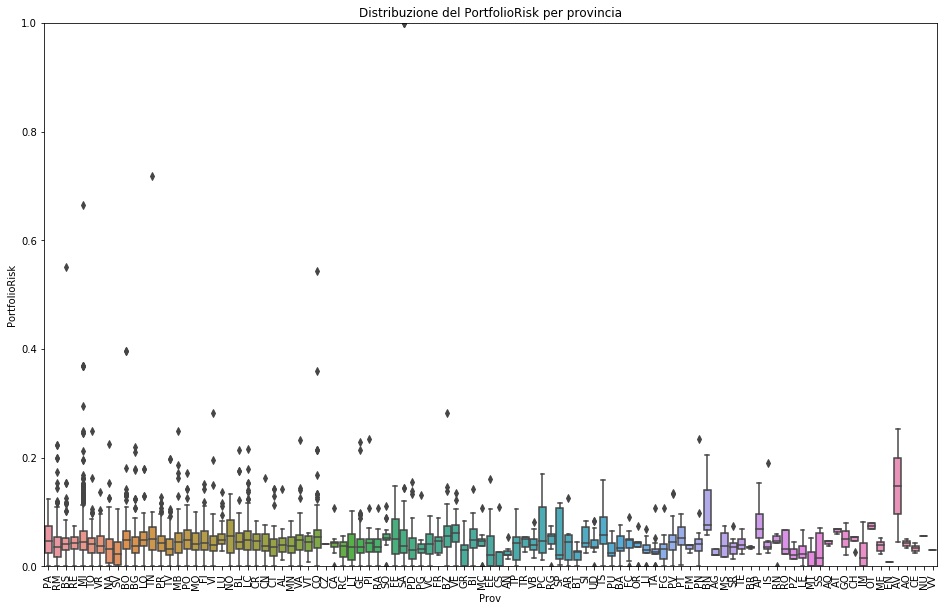

In [13]:
var = "Prov"
da = pd.concat([df["PortfolioRisk"], df[var]], axis = 1)
f, ax = plt.subplots(figsize= (16,10))
fig = sns.boxplot(x = var, y = "PortfolioRisk", data = da)
fig.axis(ymin = 0, ymax = 1)
plt.title('Distribuzione del PortfolioRisk per provincia')
plt.xticks(rotation = 90)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102]),
 <a list of 103 Text xticklabel objects>)

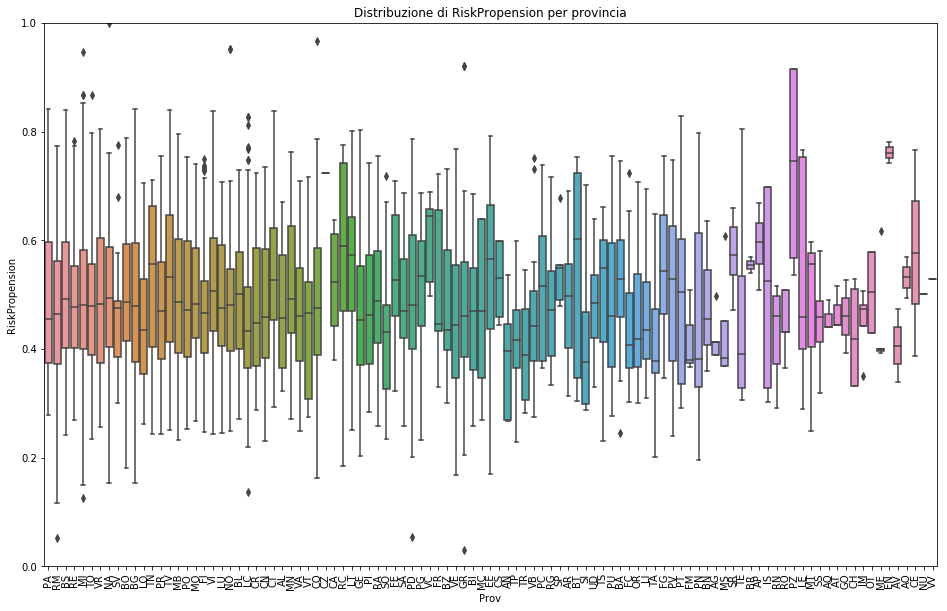

In [14]:
var = "Prov"
da = pd.concat([df["RiskPropension"], df[var]], axis = 1)
f, ax = plt.subplots(figsize= (16,10))
fig = sns.boxplot(x = var, y = "RiskPropension", data = da)
fig.axis(ymin = 0, ymax = 1)
plt.title('Distribuzione di RiskPropension per provincia')
plt.xticks(rotation = 90)

### Correlation Matrix

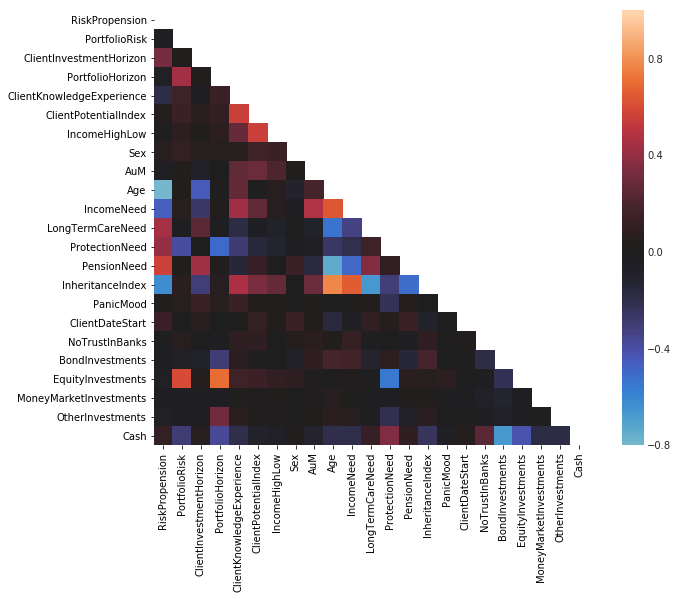

In [15]:
#Si valutano correlazioni fra le features
x = df.corr()
f, ax = plt.subplots(figsize= (12,8))
mask = np.zeros_like(x)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(x, mask=mask, center = 0, square=True)

In [5]:
clientid = df.ClientID.values

### Prima Clusterizzazione (Bond Equity Money Protectionneed Incomeneed Pensionneed )

In [17]:
dfcl_1 = df[['BondInvestments', 'EquityInvestments', 'MoneyMarketInvestments', 'ProtectionNeed', 'IncomeNeed', 'PensionNeed']]

In [18]:
dfcl_1.describe()

,BondInvestments,EquityInvestments,MoneyMarketInvestments,ProtectionNeed,IncomeNeed,PensionNeed
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,0.498821,0.230302,0.047452,0.376164,0.338791,0.417580
std,0.274451,0.198136,0.094192,0.211200,0.188517,0.239535
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.329475,0.066875,0.000000,0.216692,0.215574,0.145318
50%,0.533350,0.199150,0.023100,0.296553,0.299619,0.507460
75%,0.694300,0.348025,0.058000,0.616763,0.394999,0.609014
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Text(0.5,1,'Distribuzione Variabile BondInvestments')

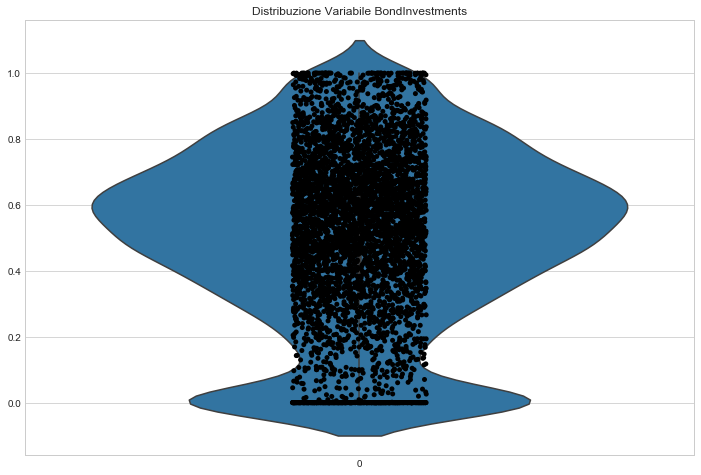

In [19]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['BondInvestments'])
ax = sns.stripplot(data=df['BondInvestments'], jitter=True, color = "black")
plt.title('Distribuzione Variabile BondInvestments')

Text(0.5,1,'Distribuzione Variabile EquityInvestments')

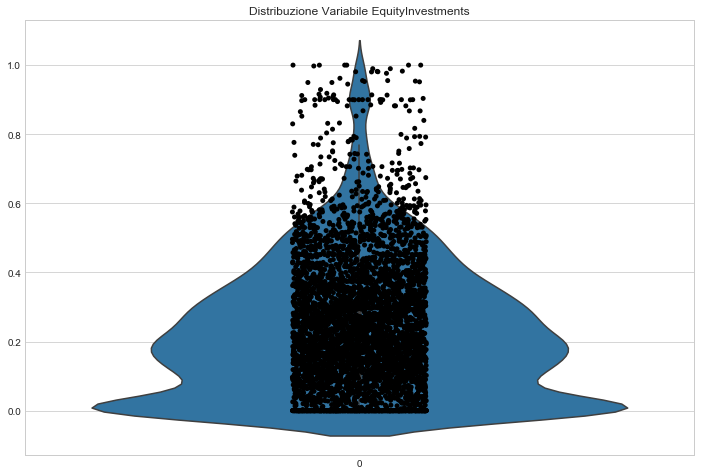

In [20]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['EquityInvestments'])
ax = sns.stripplot(data=df['EquityInvestments'], jitter=True, color = "black")
plt.title('Distribuzione Variabile EquityInvestments')

Text(0.5,1,'Distribuzione Variabile MoneyMarketInvestments')

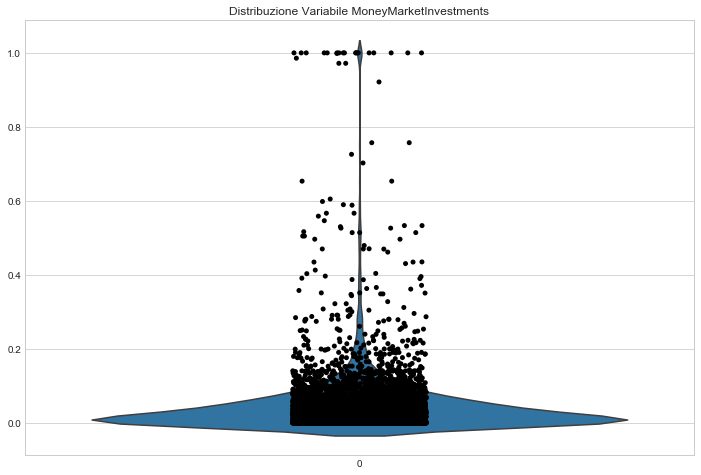

In [21]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['MoneyMarketInvestments'])
ax = sns.stripplot(data=df['MoneyMarketInvestments'], jitter=True, color = "black")
plt.title('Distribuzione Variabile MoneyMarketInvestments')

Text(0.5,1,'Distribuzione Variabile ProtectionNeed')

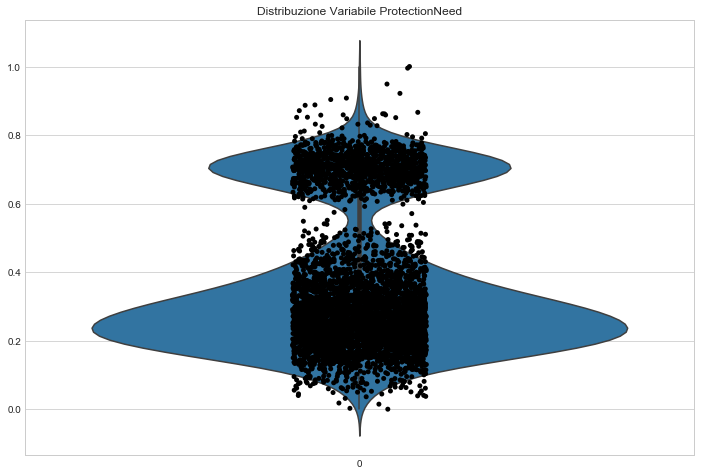

In [22]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['ProtectionNeed'])
ax = sns.stripplot(data=df['ProtectionNeed'], jitter=True, color = "black")
plt.title('Distribuzione Variabile ProtectionNeed')

Text(0.5,1,'Distribuzione Variabile IncomeNeed')

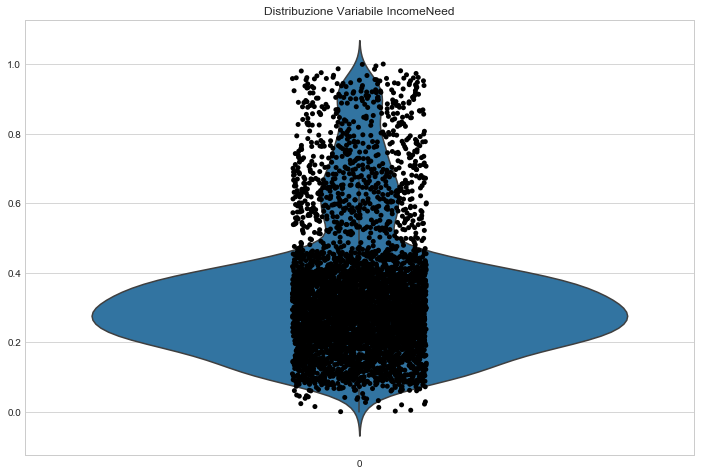

In [23]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['IncomeNeed'])
ax = sns.stripplot(data=df['IncomeNeed'], jitter=True, color = "black")
plt.title('Distribuzione Variabile IncomeNeed')

Text(0.5,1,'Distribuzione Variabile PensionNeed')

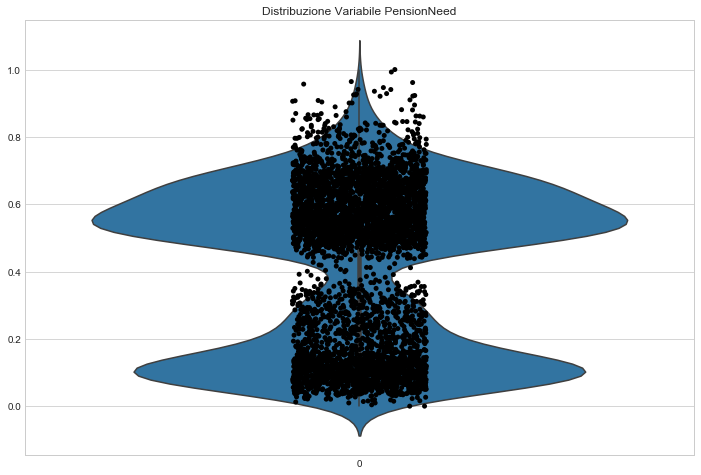

In [24]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['PensionNeed'])
ax = sns.stripplot(data=df['PensionNeed'], jitter=True, color = "black")
plt.title('Distribuzione Variabile PensionNeed')

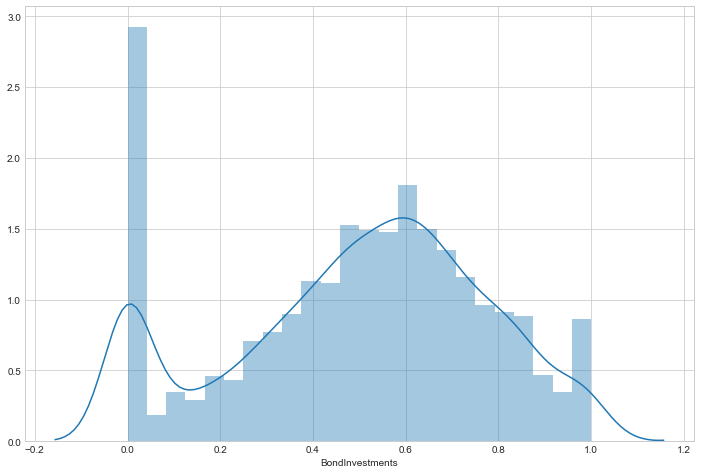

In [25]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['BondInvestments'])

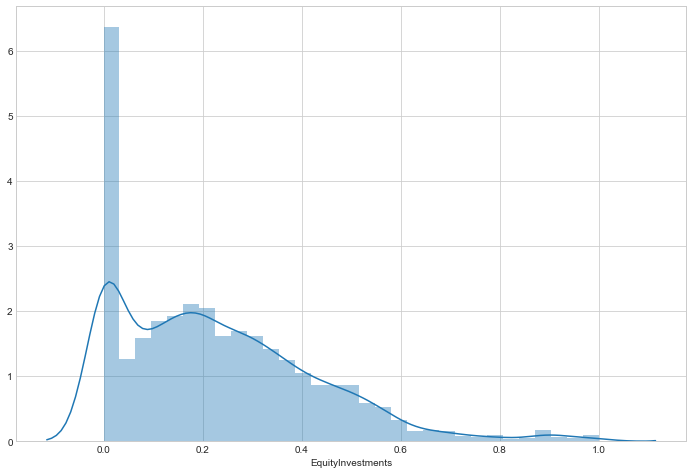

In [26]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['EquityInvestments'])

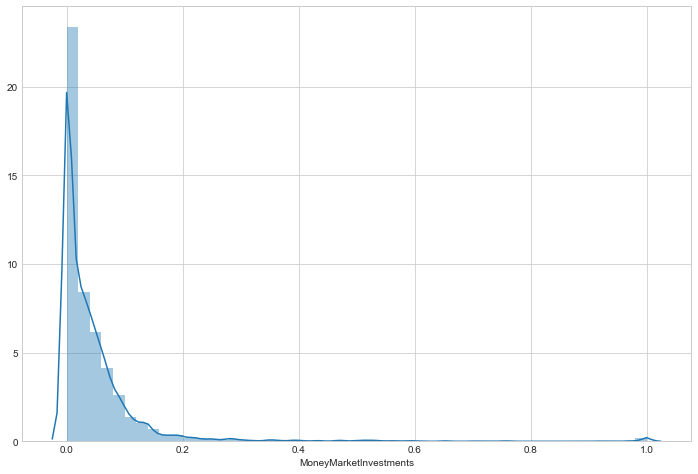

In [27]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['MoneyMarketInvestments'])

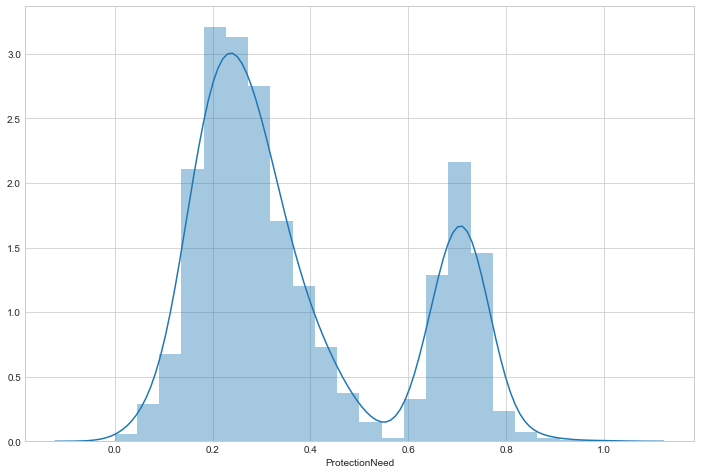

In [28]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['ProtectionNeed'])

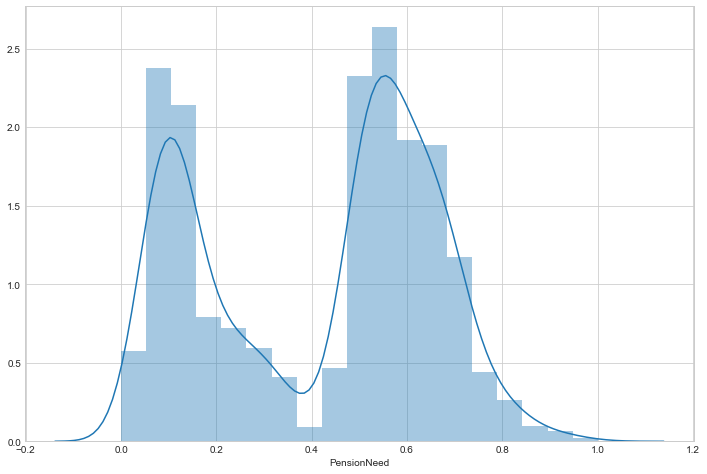

In [29]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['PensionNeed'])

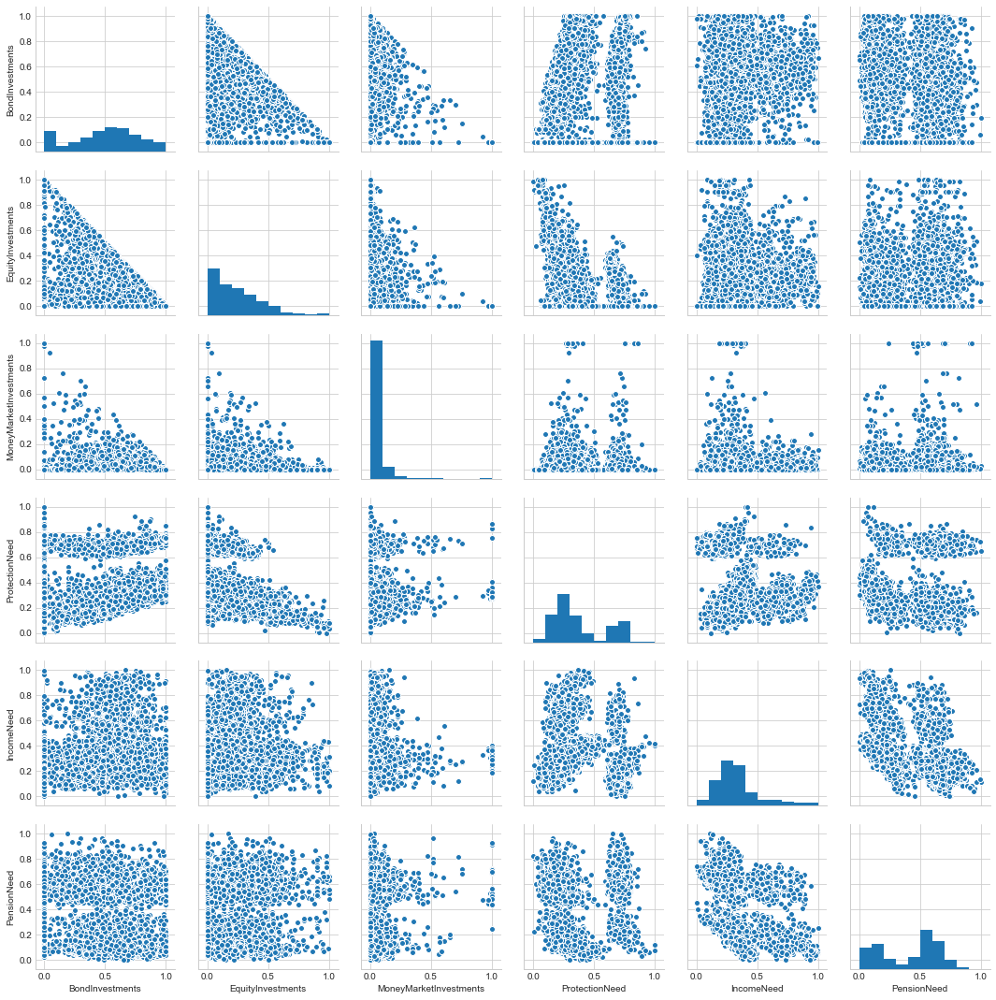

In [30]:
sns.pairplot(dfcl_1)

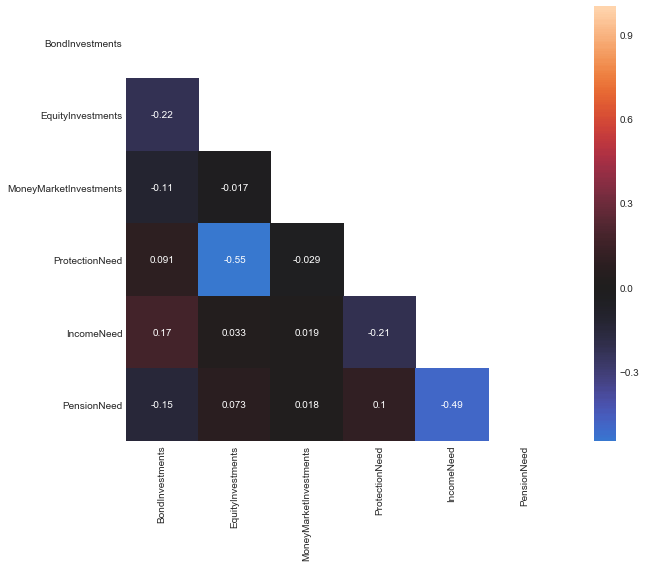

In [31]:
x = dfcl_1.corr()
f, ax = plt.subplots(figsize= (12,8))
mask = np.zeros_like(x)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(x, mask=mask, center = 0, annot=True, square=True)

## Clustering

## KMeans

In [33]:
dfcl_1.shape

(5000, 6)

In [34]:
dfkmeans_1 = dfcl_1.copy()

Text(0,0.5,'Var')

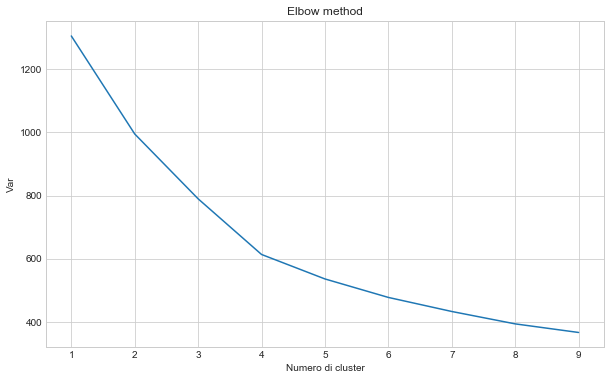

In [35]:
sns.set_style('whitegrid')
cl1 = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 12345)
    kmeans.fit(dfcl_1)
    cl1.append(kmeans.inertia_)
plt.figure(figsize=(10, 6))
plt.plot(range(1, 10), cl1)
plt.title('Elbow method')
plt.xlabel('Numero di cluster')
plt.ylabel('Var')

In [36]:
kmeans_1 = KMeans(n_clusters = 4, max_iter = 5000, random_state=123)

In [37]:
kmeans_1.fit(dfcl_1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=5000,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=123, tol=0.0001, verbose=0)

In [38]:
kmeans_1.cluster_centers_

array([[0.72133943, 0.13035166, 0.03670948, 0.57151857, 0.25495241,
        0.56398051],
       [0.40629439, 0.4232469 , 0.04921896, 0.1876847 , 0.29324628,
        0.54839979],
       [0.06034842, 0.04429499, 0.06038549, 0.53711222, 0.24719934,
        0.48139974],
       [0.63314554, 0.20999653, 0.04773755, 0.32933664, 0.49551061,
        0.14077002]])

In [39]:
kmeans_1.labels_

array([1, 1, 2, ..., 2, 3, 1])

In [40]:
clust_1 = kmeans_1.predict(dfcl_1)

In [41]:
clust_1

array([1, 1, 2, ..., 2, 3, 1])

In [42]:
print('Silhouette k-means: {}'.format(round(silhouette_score(dfcl_1, clust_1), 4)))

Silhouette k-means: 0.3073


In [43]:
kmeans_test_1 = KMeans(n_clusters = 4, max_iter = 5000, random_state=789)

In [44]:
kmeans_test_1.fit(dfcl_1)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=5000,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=789, tol=0.0001, verbose=0)

In [45]:
kmeans_test_1.cluster_centers_

array([[0.72066647, 0.13075412, 0.03699357, 0.56827829, 0.25592671,
        0.56380229],
       [0.63425875, 0.20902507, 0.04761039, 0.32970212, 0.49592808,
        0.14076079],
       [0.06034842, 0.04429499, 0.06038549, 0.53711222, 0.24719934,
        0.48139974],
       [0.40410968, 0.42538435, 0.04921207, 0.18743408, 0.29315062,
        0.54680671]])

In [46]:
clust_test_1 = kmeans_test_1.predict(dfkmeans_1)

In [47]:
dfcl_1['ClientId'] = clientid.tolist()
dfcl_1['Cluster'] = clust_1.tolist()
grouped = dfcl_1.groupby(['Cluster']).mean()

In [48]:
count = dfcl_1.groupby(['Cluster']).count()['ClientId']
grouped['Count'] = count.tolist()

In [49]:
grouped

,BondInvestments,EquityInvestments,MoneyMarketInvestments,ProtectionNeed,IncomeNeed,PensionNeed,Count
Cluster,,,,,,,
0,0.721339,0.130352,0.036709,0.571519,0.254952,0.563981,1202
1,0.406294,0.423247,0.049219,0.187685,0.293246,0.548400,1514
2,0.060348,0.044295,0.060385,0.537112,0.247199,0.481400,758
3,0.633146,0.209997,0.047738,0.329337,0.495511,0.140770,1526


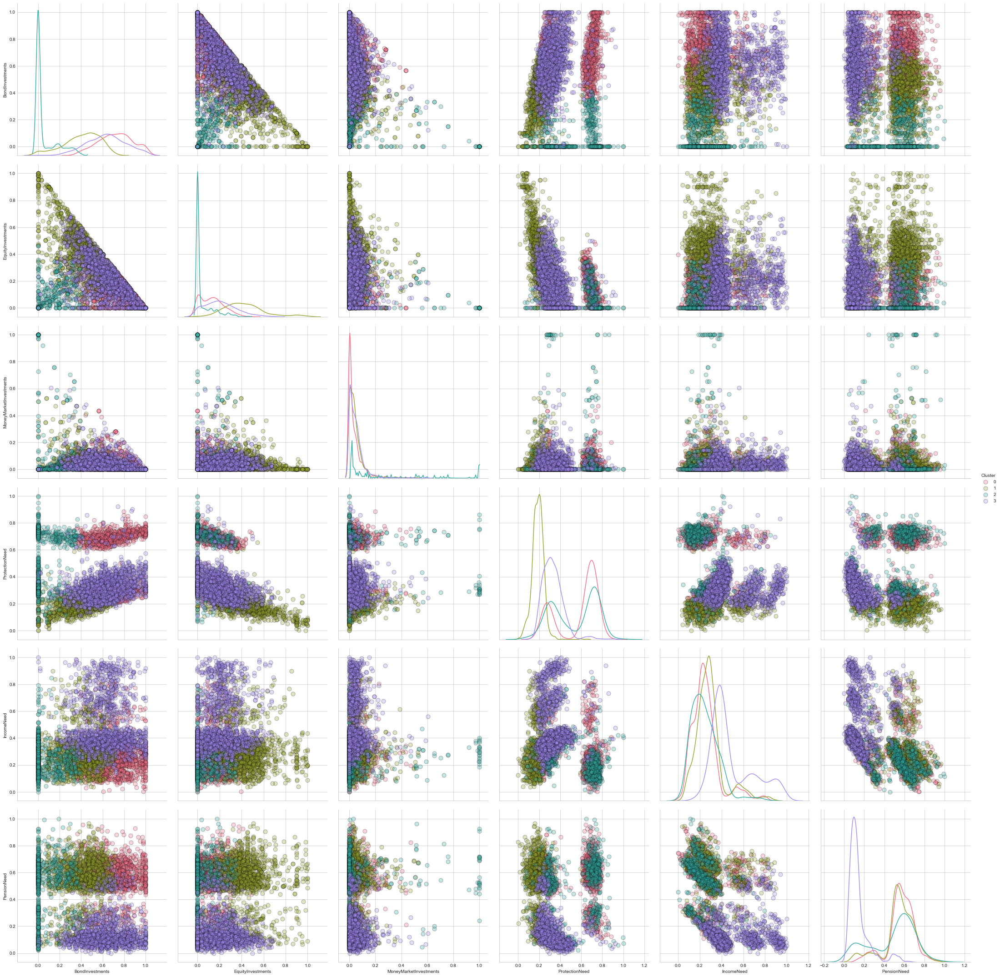

In [50]:
sns.pairplot(dfcl_1, palette="husl", plot_kws = {'alpha': 0.3, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['BondInvestments', 'EquityInvestments', 'MoneyMarketInvestments', 'ProtectionNeed','IncomeNeed', 'PensionNeed'])

In [51]:
dftemp = dfcl_1[['BondInvestments', 'Cluster']]

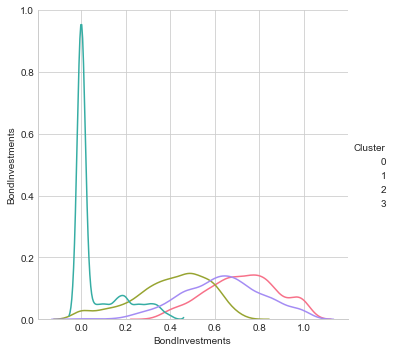

In [54]:
sns.pairplot(dftemp, palette="husl", plot_kws = {'alpha': 0.8, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['BondInvestments'])

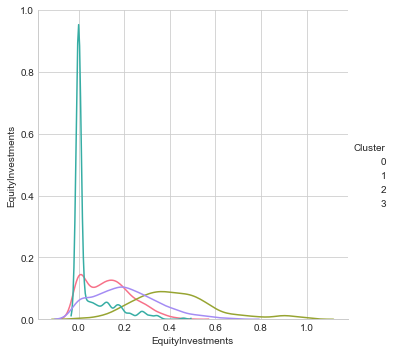

In [56]:
dftemp = dfcl_1[['EquityInvestments', 'Cluster']]
sns.pairplot(dftemp, palette="husl", plot_kws = {'alpha': 0.8, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['EquityInvestments'])

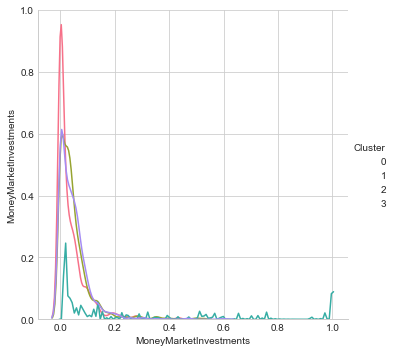

In [57]:
dftemp = dfcl_1[['MoneyMarketInvestments', 'Cluster']]
sns.pairplot(dftemp, palette="husl", plot_kws = {'alpha': 0.8, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['MoneyMarketInvestments'])

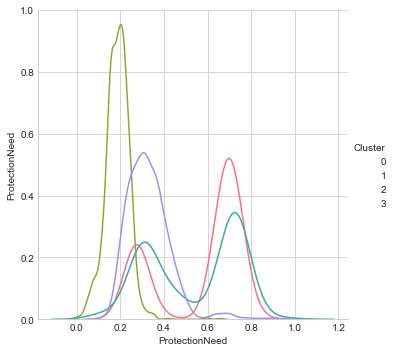

In [58]:
dftemp = dfcl_1[['ProtectionNeed', 'Cluster']]
sns.pairplot(dftemp, palette="husl", plot_kws = {'alpha': 0.8, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['ProtectionNeed'])

In [ ]:
dftemp = dfcl_1[['ProtectionNeed', 'Cluster']]
sns.pairplot(dftemp, palette="husl", plot_kws = {'alpha': 0.8, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['ProtectionNeed'])

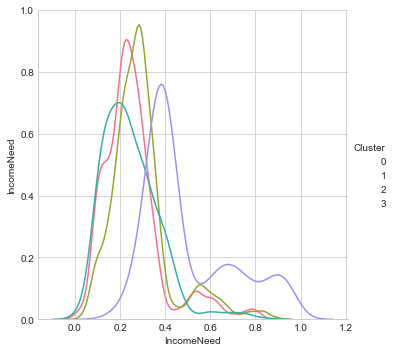

In [59]:
dftemp = dfcl_1[['IncomeNeed', 'Cluster']]
sns.pairplot(dftemp, palette="husl", plot_kws = {'alpha': 0.8, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['IncomeNeed'])

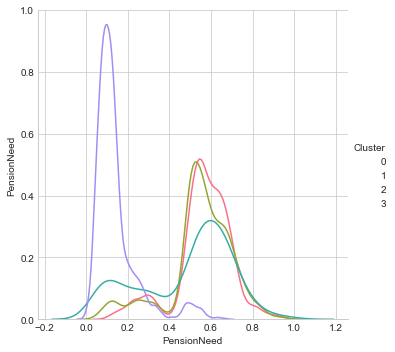

In [60]:
dftemp = dfcl_1[['PensionNeed', 'Cluster']]
sns.pairplot(dftemp, palette="husl", plot_kws = {'alpha': 0.8, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['PensionNeed'])

## Seconda Clusterizzazione (Equity, potential index, risk propension)

Text(0.5,1,'Distribuzione Variabile RiskPropension')

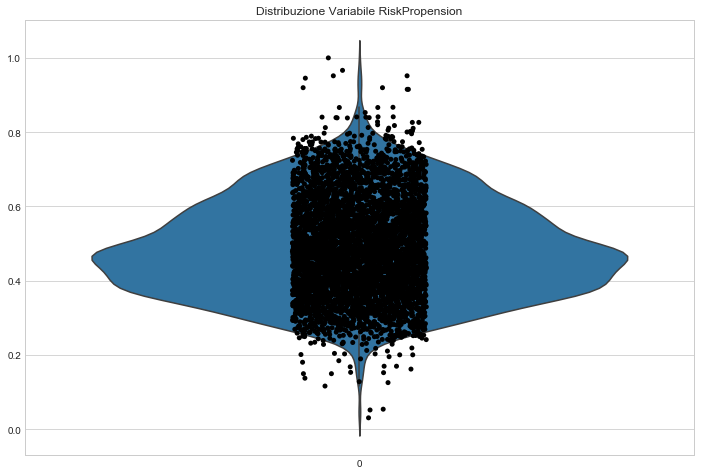

In [61]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['RiskPropension'])
ax = sns.stripplot(data=df['RiskPropension'], jitter=True, color = "black")
plt.title('Distribuzione Variabile RiskPropension')

Text(0.5,1,'Distribuzione Variabile PortfolioRisk')

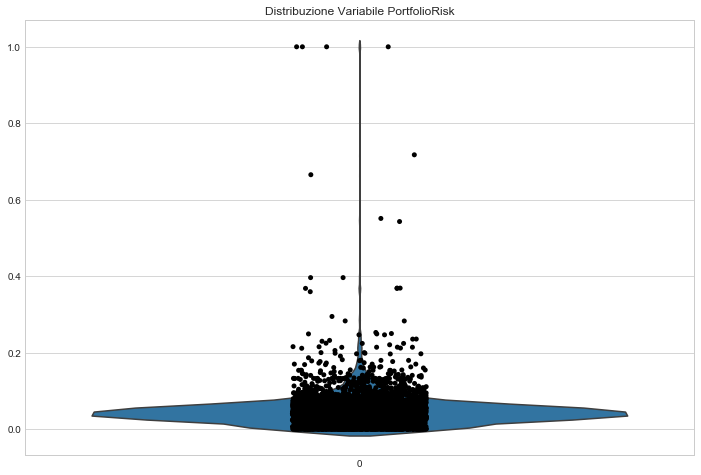

In [62]:
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['PortfolioRisk'])
ax = sns.stripplot(data=df['PortfolioRisk'], jitter=True, color = "black")
plt.title('Distribuzione Variabile PortfolioRisk')

Text(0.5,1,'Distribuzione Variabile EquityInvestments')

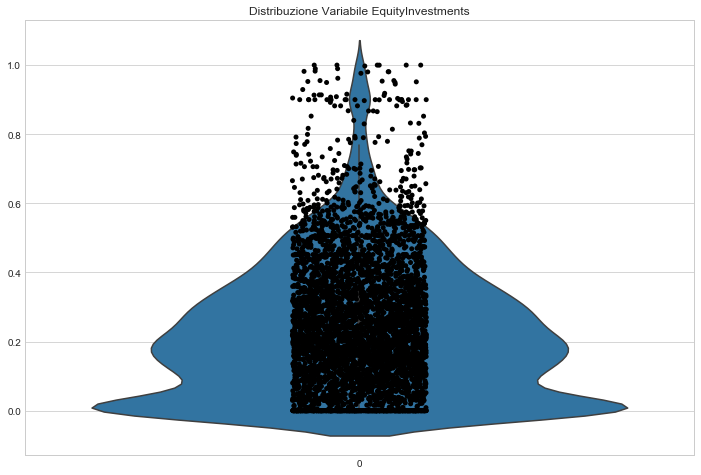

In [63]:
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['EquityInvestments'])
ax = sns.stripplot(data=df['EquityInvestments'], jitter=True, color = "black")
plt.title('Distribuzione Variabile EquityInvestments')

Text(0.5,1,'Distribuzione Variabile EquityInvestments')

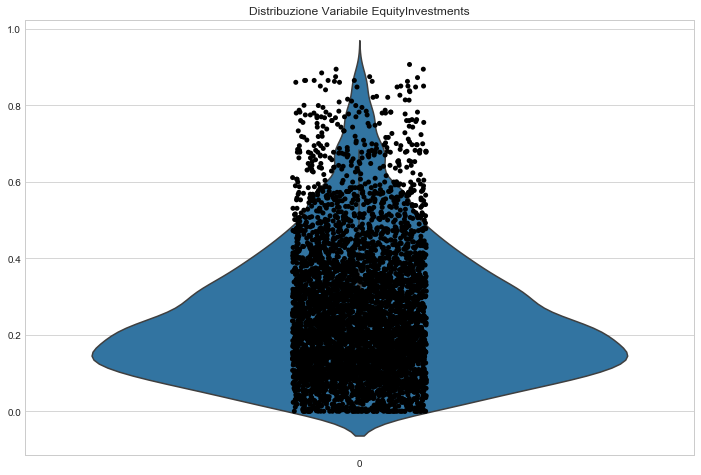

In [64]:
f, ax = plt.subplots(figsize= (12,8))
ax = sns.violinplot(data = df['ClientPotentialIndex'])
ax = sns.stripplot(data=df['ClientPotentialIndex'], jitter=True, color = "black")
plt.title('Distribuzione Variabile EquityInvestments')

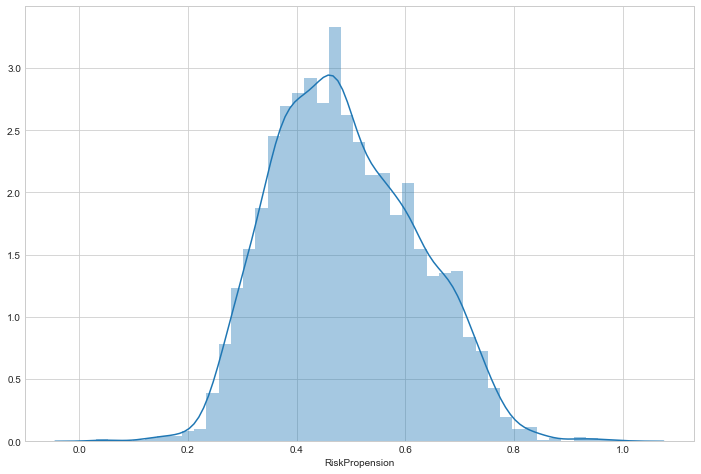

In [65]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['RiskPropension'])

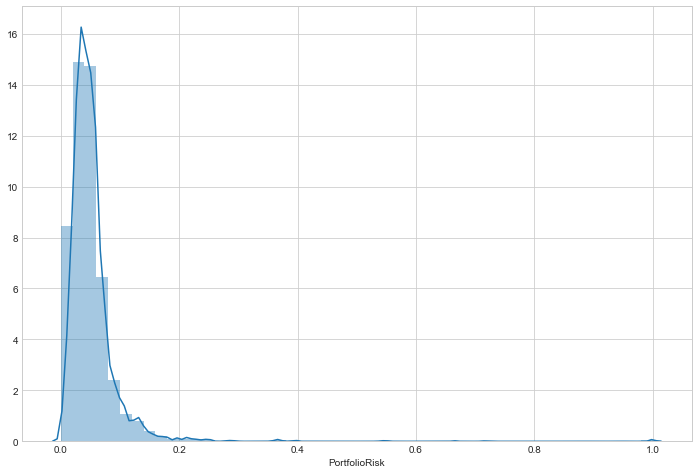

In [66]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['PortfolioRisk'])

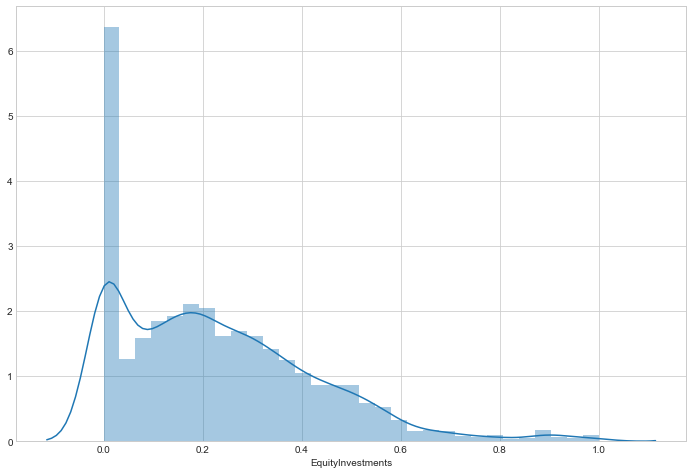

In [67]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['EquityInvestments'])

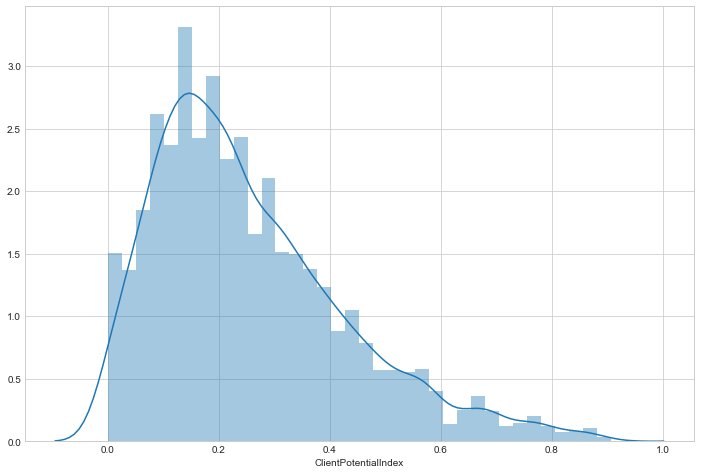

In [68]:
f, ax = plt.subplots(figsize= (12,8))
sns.distplot(df['ClientPotentialIndex'])

In [69]:
#Si forniscono alcuni quantili delle variabili
c = [0.1, 0.25, 0.5, 0.6, 0.75, 0.95, 0.99]
df['RiskPropension'].quantile(q = c)

0.10    0.326151
0.25    0.388924
0.50    0.476067
0.60    0.512017
0.75    0.581871
0.95    0.715041
0.99    0.783597
Name: RiskPropension, dtype: float64

In [70]:
df['PortfolioRisk'].quantile(q = c)

0.10    0.006783
0.25    0.026103
0.50    0.042425
0.60    0.048312
0.75    0.059148
0.95    0.107536
0.99    0.181228
Name: PortfolioRisk, dtype: float64

In [71]:
df['EquityInvestments'].quantile(q = c)

0.10    0.000000
0.25    0.066875
0.50    0.199150
0.60    0.255200
0.75    0.348025
0.95    0.577710
0.99    0.899505
Name: EquityInvestments, dtype: float64

In [72]:
df['ClientPotentialIndex'].quantile(q = c)

0.10    0.065031
0.25    0.128834
0.50    0.216564
0.60    0.262577
0.75    0.350307
0.95    0.594479
0.99    0.782209
Name: ClientPotentialIndex, dtype: float64

In [6]:
dfcl_2 = df[['RiskPropension', 'PortfolioRisk', 'EquityInvestments','ClientPotentialIndex']]

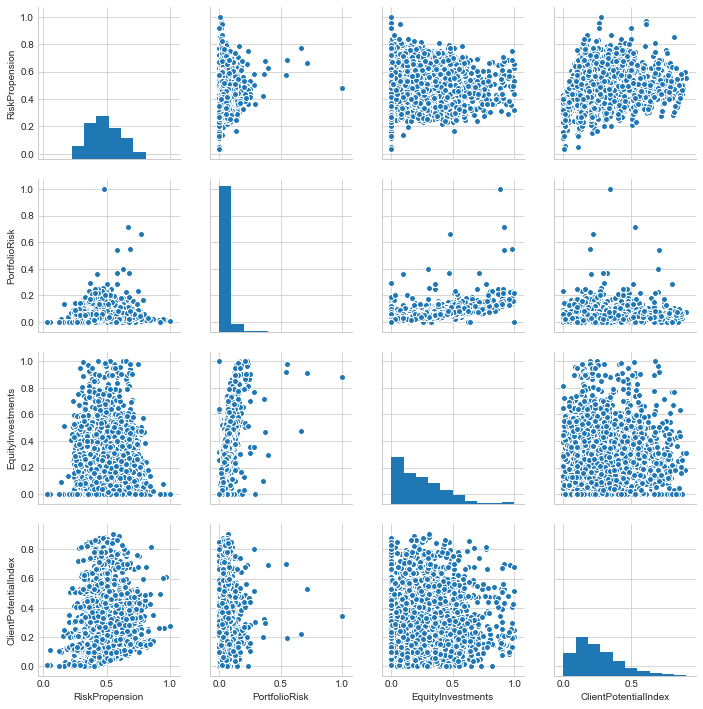

In [74]:
sns.pairplot(dfcl_2)

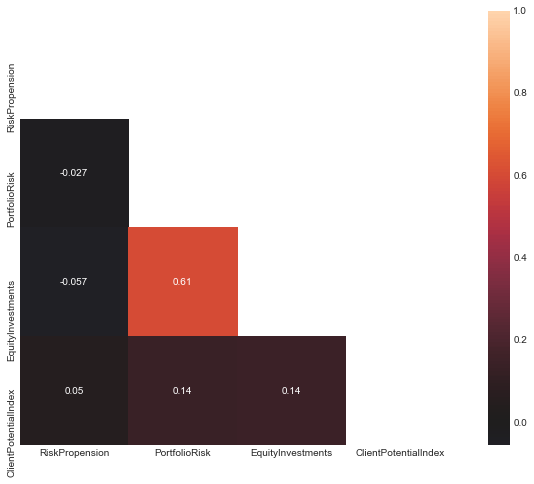

In [75]:
x = dfcl_2.corr()
f, ax = plt.subplots(figsize= (12,8))
mask = np.zeros_like(x)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(x, mask=mask, center = 0, annot=True, square=True)

Zoom su equityInvestments e PortfolioRisk

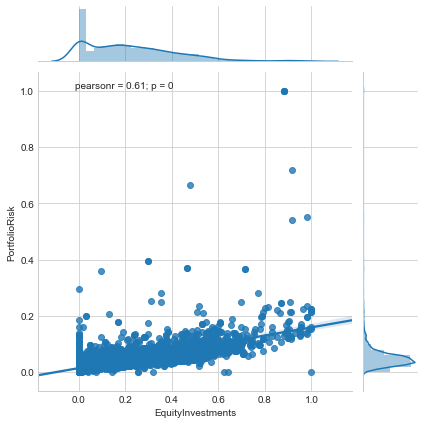

In [76]:
sns.jointplot("EquityInvestments", "PortfolioRisk", data=df, kind='reg')

Cerchiamo la correlazione più sensata con la variabile age (fra le 2 variabili RiskPropension e PortfolioRisk), e che quindi rispetta maggiormente il reale profilo di rischio del cliente, per poi droppare l'altra

RiskPropension e Age

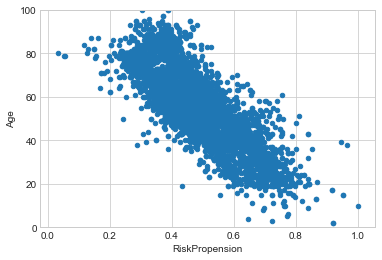

In [77]:
var = 'RiskPropension'
data2 = pd.concat([df['Age'], df[var]], axis=1)
data2.plot.scatter(x=var, y='Age', ylim=(0,100))

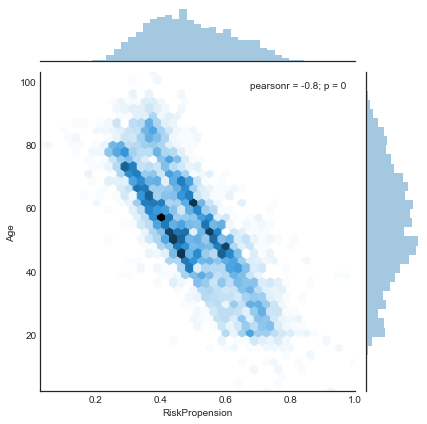

In [78]:
with sns.axes_style('white'):
    g = sns.jointplot("RiskPropension", "Age", df, kind='hex')

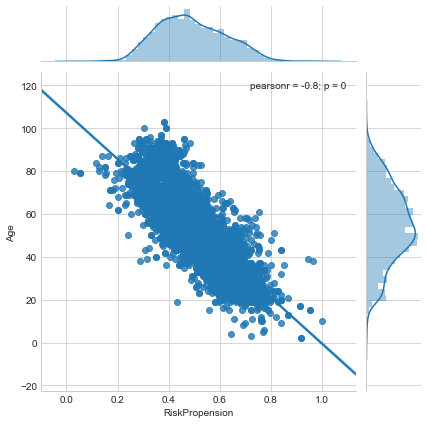

In [79]:
sns.jointplot("RiskPropension", "Age", data=df, kind='reg')

PortfolioRisk e Age

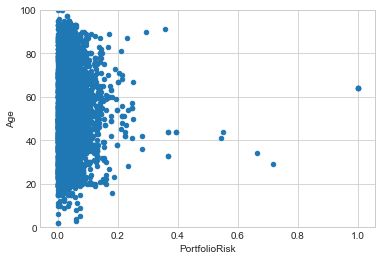

In [80]:
var = 'PortfolioRisk'
data2 = pd.concat([df['Age'], df[var]], axis=1)
data2.plot.scatter(x=var, y='Age', ylim=(0,100));

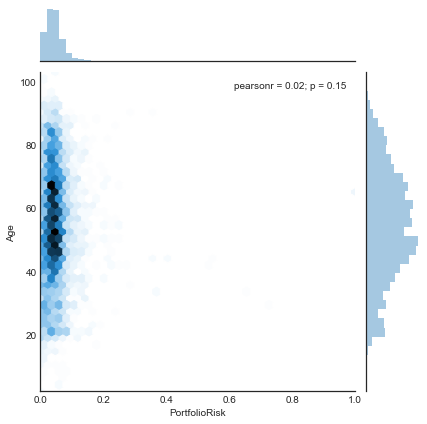

In [81]:
with sns.axes_style('white'):
    g = sns.jointplot("PortfolioRisk", "Age", df, kind='hex')

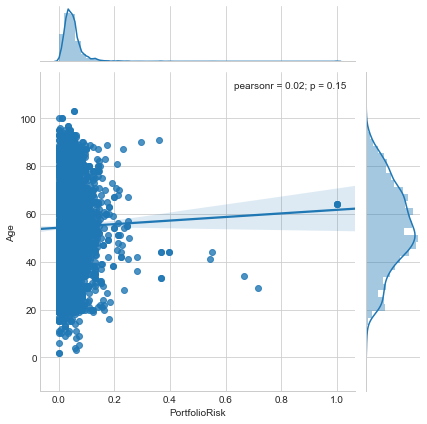

In [82]:
sns.jointplot("PortfolioRisk", "Age", data=df, kind='reg')

Curiosa l'assenza di correlazione tra la variabile Risk Propension e Portfolio Risk

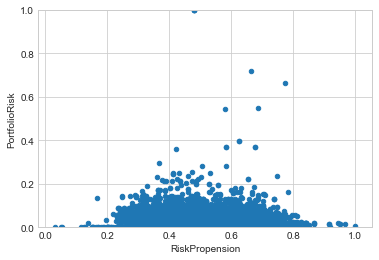

In [83]:
var = 'RiskPropension'
data2 = pd.concat([df['PortfolioRisk'], df[var]], axis=1)
data2.plot.scatter(x=var, y='PortfolioRisk', ylim=(0,1));

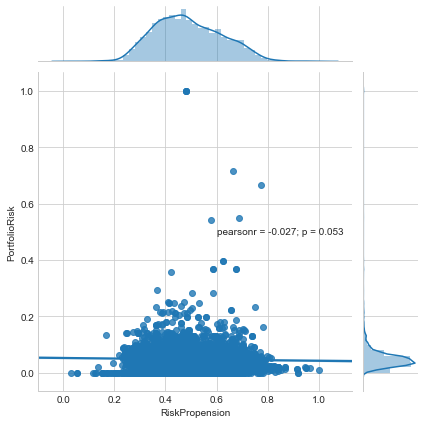

In [84]:
sns.jointplot("RiskPropension", "PortfolioRisk", data=df, kind='reg')

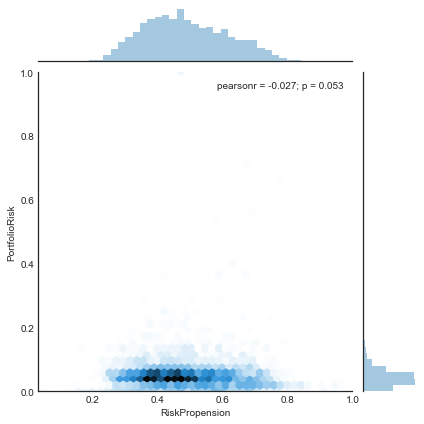

In [85]:
with sns.axes_style('white'):
    sns.jointplot("RiskPropension", "PortfolioRisk", df, kind='hex')

### Non esiste correlazione tra RiskPropension e PortfolioRisk. Ciò è alquanto curioso e strano. Probabilmente una delle due variabili non rispecchia il reale profilo di rischio del cliente. 

### Si decide di tenere solo la variabile RiskPropension e di scartare PortfolioRisk, in quanto la prima risulta essere correlata, negativamente, con l'età (guarda  grafici su), mentre la seconda stranamente no (guarda  grafici su)...

In [7]:
dfcl_2.drop('PortfolioRisk', axis = 1, inplace=True)

In [8]:
dfcl_2.columns

Index(['RiskPropension', 'EquityInvestments', 'ClientPotentialIndex'], dtype='object')

### Clustering

### Visualizzazione variabili per clustering

In [88]:
columns =  dfcl_2.columns.tolist()
print(columns)

['RiskPropension', 'EquityInvestments', 'ClientPotentialIndex']


In [89]:
# Select the columns
plottingData = dfcl_2.loc[:, columns]

# peek view into the new dataset
plottingData.head()

,RiskPropension,EquityInvestments,ClientPotentialIndex
0,0.597553,0.4270,0.148466
1,0.501486,0.4466,0.152761
2,0.554108,0.0000,0.243558
3,0.440729,0.1220,0.089571
4,0.540528,0.2701,0.162577


In [90]:
def make_boxplot(dataToPlot, threshold=None, vertical=True, use_notch=True,
                 fill_boxes=True, colors=None, mean_color='#ef4a5f'):

    data = dataToPlot.copy()
    columns = data.columns.tolist()

    if threshold:
        for c in data.columns:
            data.loc[:, c] = list(map((lambda x: x if x <= threshold else np.nan),
                                      data.loc[:, c].values))

    if vertical:
        labels_rotation=45
    else:
        labels_rotation=0
        
    boxplot = data.boxplot(column=columns, grid=False, notch=use_notch,
                           figsize=(16, 8), rot=labels_rotation,
                           patch_artist=fill_boxes, vert=vertical,
                           return_type='dict',)
        
    means = data.mean()
    std = data.std()

    if (fill_boxes):
        if colors is None:  
            colors = ['#87edd4', '#f7ef0e', '#ffa216', '#ff167e',
                      '#ff1111', '#e6ed86']
        
        i = 0
        for box in boxplot['boxes']:
            box.set_color(colors[i])
            box.set_alpha(0.5)
            i = i + 1
            if i == len(colors):
                i = 0
    
    if vertical:
        for j in range(len(columns)):
            y = data.loc[:, columns[j]]
            x = np.random.normal(j + 1, 0.04, size=len(y))
            plt.plot(x, y, 'r.', alpha=0.2)
            plt.plot(j + 1, means.iloc[j], color=mean_color, marker='o', alpha=0.7)
            plt.errorbar(j + 1, means.iloc[j],
                        color=mean_color, yerr=std.iloc[j],
                        alpha=0.7, elinewidth=4)
    else:
        for j in range(len(columns)):
            x = data.loc[:, columns[j]]
            y = np.random.normal(j + 1, 0.04, size=len(x))
            plt.plot(x, y, 'r.', alpha=0.2)
            plt.plot(means.iloc[j], j + 1, color=mean_color, marker='o', alpha=0.7)
            plt.errorbar(means.iloc[j], j + 1,
                        color=mean_color, xerr=std.iloc[j],
                        alpha=0.7, elinewidth=4)
   

    plt.show()  

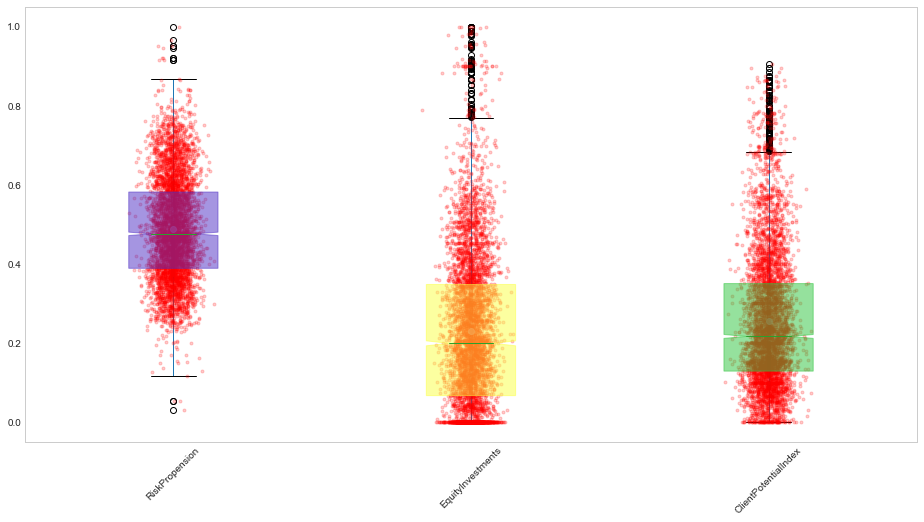

In [91]:
colors = ['#4d2dc4', '#fbff42', '#2dc43c']

make_boxplot(plottingData, threshold=20, vertical=True, use_notch=True, fill_boxes=True, colors=colors)

----------------------------------------------

#### Si utilizzeranno le variabili RiskPropension, ClientPotentialIndex, EquityInvestments per il clustering. Osserviamo la loro distribuzione in un plot 3d

Text(0.5,0,'EquityInvestments')

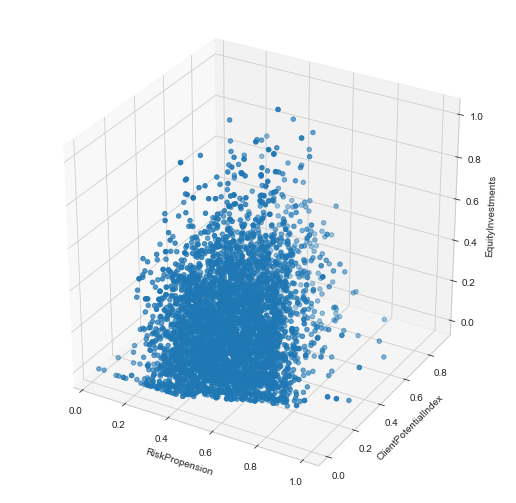

In [92]:
xs = np.array(dfcl_2['RiskPropension'])
ys = np.array(dfcl_2['ClientPotentialIndex'])
zs = np.array(dfcl_2['EquityInvestments'])

fig = plt.figure(figsize=(9, 9))
threedee = fig.add_subplot(111, projection='3d')
threedee.scatter(dfcl_2['RiskPropension'], dfcl_2['ClientPotentialIndex'], dfcl_2['EquityInvestments'])
threedee.set_xlabel('RiskPropension')
threedee.set_ylabel('ClientPotentialIndex')
threedee.set_zlabel('EquityInvestments')

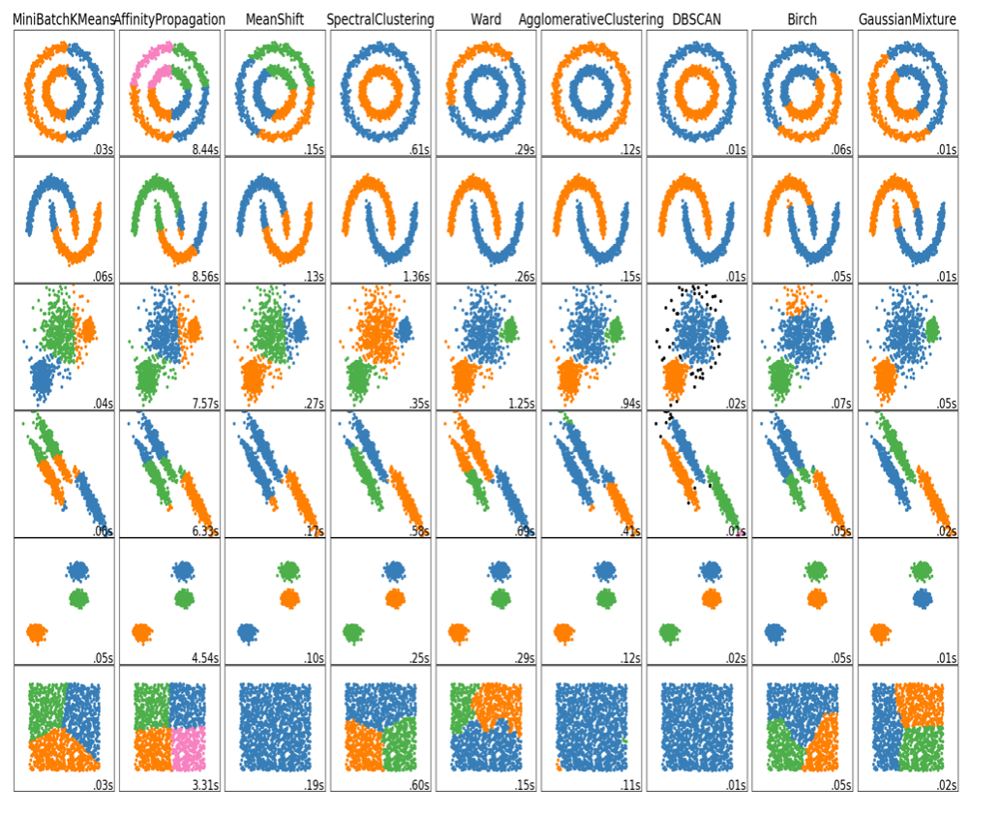

In [78]:
Image(filename='C:/Users/done-/AdviseOnly_CLUSTERING/Cattura.PNG', width = 700, height =700)

### Confrontiamo la distribuzione dei valori (grafico 3d) con il tipo di clustering per tipo di distribuzione. I nostri dati sembrano distribuirsi come gli esempi della terza riga dell'immagine soprastante

### Utilizzeremo quindi gli algoritmi K-Means, Ward Hierarchical

----------------------------------------------------------------

## K-Means

In [9]:
dfcl_2.shape

(5000, 3)

In [10]:
dfkmeans_2 = dfcl_2.copy()

Text(0,0.5,'Var')

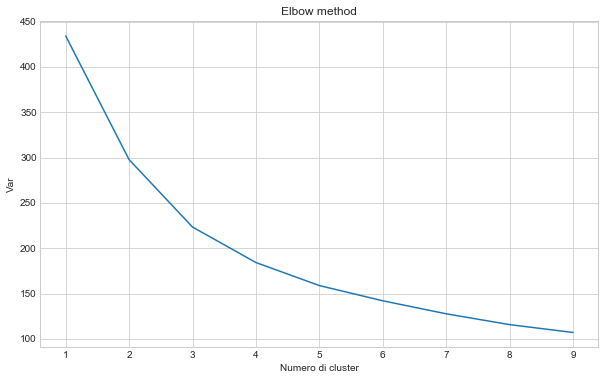

In [99]:
sns.set_style('whitegrid')
cl1 = []
for i in range(1, 10):
    kmeans_2 = KMeans(n_clusters = i, init = 'k-means++', random_state = 12345)
    kmeans_2.fit(dfcl_2)
    cl1.append(kmeans_2.inertia_)
plt.figure(figsize=(10, 6))
plt.plot(range(1, 10), cl1)
plt.title('Elbow method')
plt.xlabel('Numero di cluster')
plt.ylabel('Var')

##### Il grafico sopra mostra l'andamente della somma delle distanze al quadrato di ogni osservazione dal centroide del suo cluster per ogni K-means (1<= K < 10)

#### Si utilizzeranno 4 cluster

In [11]:
kmeans_2 = KMeans(n_clusters = 4, max_iter = 5000, random_state=123)

In [12]:
kmeans_2.fit(dfkmeans_2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=5000,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=123, tol=0.0001, verbose=0)

In [13]:
kmeans_2.cluster_centers_

array([[0.48501493, 0.4979363 , 0.22775864],
       [0.47033952, 0.24312721, 0.52475959],
       [0.38993342, 0.13312058, 0.15310513],
       [0.62672935, 0.09954524, 0.21303233]])

In [14]:
kmeans_2.labels_

array([0, 0, 3, ..., 3, 2, 0])

In [15]:
clust_2 = kmeans_2.predict(dfkmeans_2)

In [16]:
clust_2

array([0, 0, 3, ..., 3, 2, 0])

In [17]:
print('Silhouette k-means: {}'.format(round(silhouette_score(dfkmeans_2, clust_2), 4)))

Silhouette k-means: 0.2745


Inizializziamo i cluster con centroidi diversi (seed differente), e vediamo se giungiamo allo stesso risultato

In [107]:
kmeans_test_2 = KMeans(n_clusters = 4, max_iter = 5000, random_state=789)

In [108]:
kmeans_test_2.fit(dfcl_2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=5000,
    n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=789, tol=0.0001, verbose=0)

In [109]:
kmeans_test_2.cluster_centers_

array([[0.46951841, 0.24358348, 0.52498136],
       [0.62693222, 0.09948335, 0.21400449],
       [0.39027802, 0.13324868, 0.15285823],
       [0.48506357, 0.49808809, 0.22779977]])

In [110]:
clust_test_2 = kmeans_test_2.predict(dfkmeans_2)

In [111]:
print('Silhouette k-means: {}'.format(round(silhouette_score(dfkmeans_2, clust_test_2), 4)))

Silhouette k-means: 0.2746


I centroidi sono uguali e la silhoutte ha anche lo stesso valore!!! :O

In [18]:
dfkmeans_2['ClientId'] = clientid.tolist()
dfkmeans_2['Cluster'] = clust_2.tolist()

In [19]:
dfkmeans_2.head(10)

,RiskPropension,EquityInvestments,ClientPotentialIndex,ClientId,Cluster
0,0.597553,0.4270,0.148466,Client1,0
1,0.501486,0.4466,0.152761,Client2,0
2,0.554108,0.0000,0.243558,Client3,3
3,0.440729,0.1220,0.089571,Client4,2
4,0.540528,0.2701,0.162577,Client5,3
5,0.565080,0.2488,0.279755,Client6,3
6,0.582234,0.3049,0.372393,Client7,1
7,0.337518,0.0000,0.106135,Client8,2
8,0.323620,0.0000,0.400000,Client9,2
9,0.557302,0.1833,0.074847,Client10,3


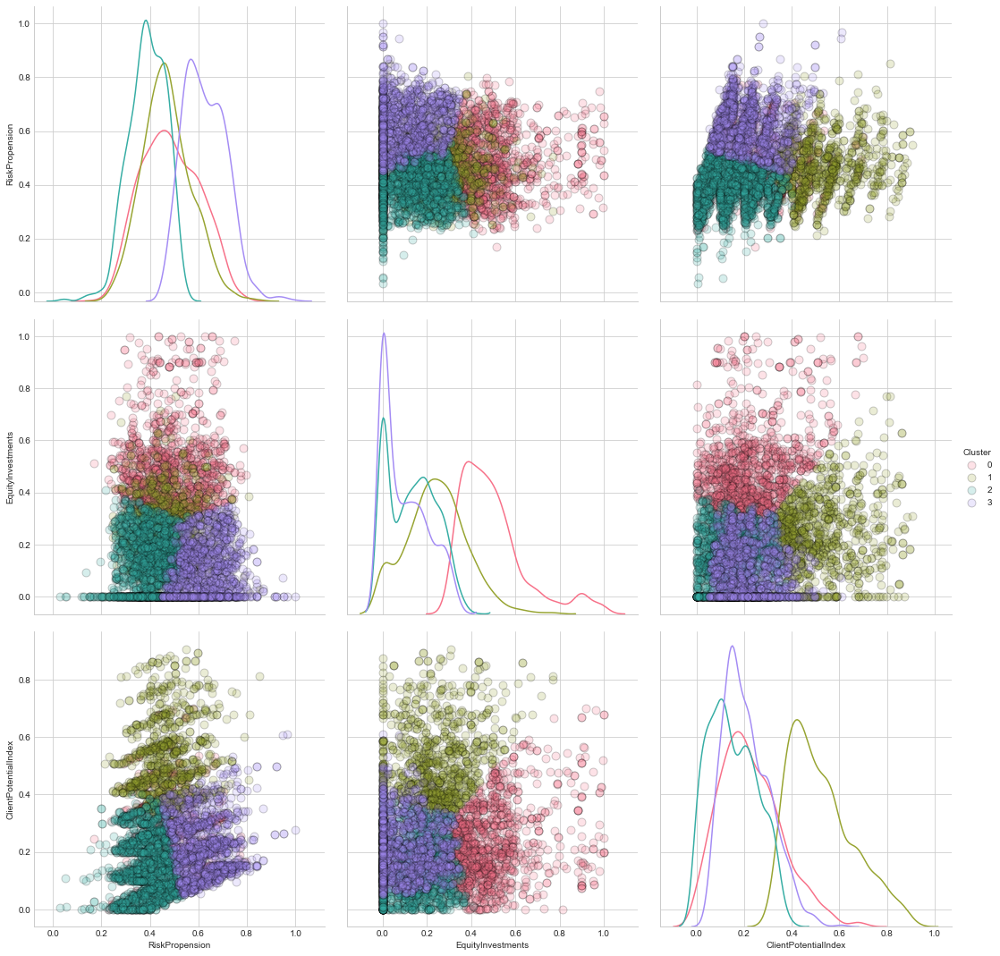

In [24]:
sns.pairplot(dfkmeans_2, palette="husl", plot_kws = {'alpha': 0.2, 's': 80, 'edgecolor': 'k'},  
             kind='scatter',diag_kind='kde', hue='Cluster', size=5,  aspect= 1, 
             vars=['RiskPropension', 'EquityInvestments', 'ClientPotentialIndex'])

In [115]:
grouped = dfkmeans_2.groupby(['Cluster']).mean()

In [116]:
count = dfkmeans_2.groupby(['Cluster']).count()['RiskPropension']

In [117]:
grouped['Count'] = count.tolist()

In [119]:
grouped

,RiskPropension,EquityInvestments,ClientPotentialIndex,Count
Cluster,,,,
0,0.485015,0.497936,0.227759,1168
1,0.470340,0.243127,0.524760,941
2,0.389933,0.133121,0.153105,1589
3,0.626729,0.099545,0.213032,1302


### Cluster 0 : Clienti a cui proporre una diversificazione verso strumento meno variabili

### Cluster 1: Clienti a posto 

### Cluster 2: Clienti meno interessanti

### Cluster 3: Pepite d'oro

Text(0.5,0,'EquityInvestments')

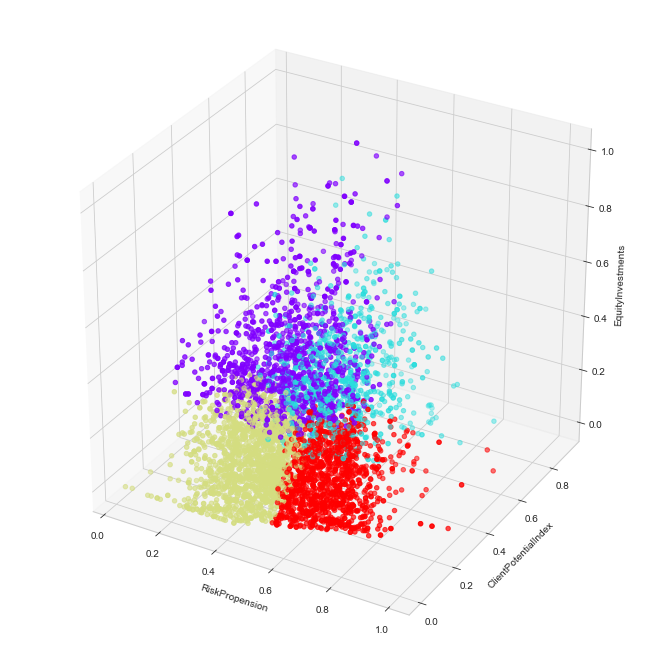

In [121]:
fig = plt.figure(figsize=(9,9))
ax = Axes3D(fig)
ax.scatter(dfcl_2['RiskPropension'].values, dfcl_2['ClientPotentialIndex'].values, dfcl_2['EquityInvestments'].values, c=kmeans_2.labels_, cmap='rainbow')
ax.set_xlabel('RiskPropension')
ax.set_ylabel('ClientPotentialIndex')
ax.set_zlabel('EquityInvestments')

## Ward Hierchiacal Clustering

In [122]:
dfward = dfcl_2.copy()

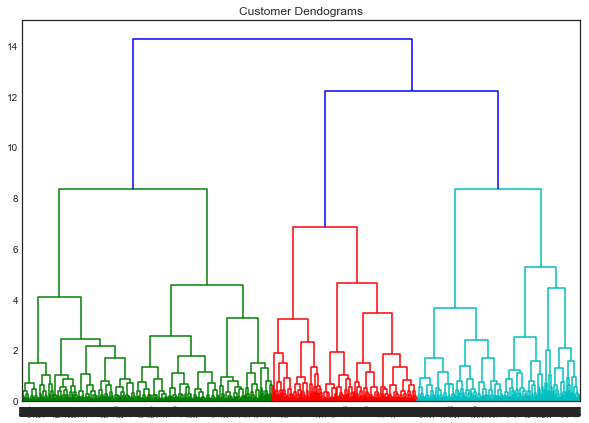

In [123]:
sns.set_style('white')
plt.figure(figsize=(10, 7))  
plt.title("Customer Dendograms")  
dend = shc.dendrogram(shc.linkage(dfward, method='ward')) 

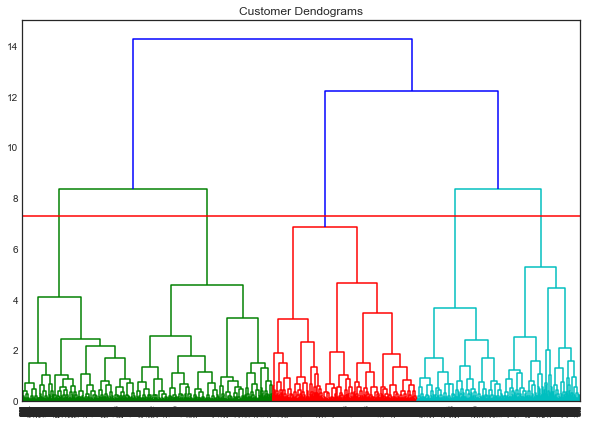

In [124]:
plt.figure(figsize=(10, 7))
plt.title("Customer Dendograms")  
dend = shc.dendrogram(shc.linkage(dfward, method='ward')) 
plt.axhline(y=7.3, color='r', linestyle='-')

#### Si decide di tagliare l'albero al livello 7.3, corrispondente a 5 cluster

In [125]:
cluster = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')  
clus = cluster.fit_predict(dfward)

In [126]:
print('Silhouette Ward Hiechical Clustering: {}'.format(round(silhouette_score(dfward, clus), 4)))

Silhouette Ward Hiechical Clustering: 0.2101


In [127]:
dfward['Cluster'] = clus.tolist()

In [128]:
dfward['ClientID'] = clientid

In [129]:
dfward.head()

,RiskPropension,EquityInvestments,ClientPotentialIndex,Cluster,ClientID
0,0.597553,0.4270,0.148466,3,Client1
1,0.501486,0.4466,0.152761,3,Client2
2,0.554108,0.0000,0.243558,2,Client3
3,0.440729,0.1220,0.089571,4,Client4
4,0.540528,0.2701,0.162577,3,Client5


In [130]:
groupedhier = dfward.groupby('Cluster').mean()

In [131]:
groupedhier = dfward.groupby('Cluster').mean()
counthier = dfward.groupby(['Cluster']).count()['RiskPropension'] #Conteggio le osservazioni per ogni cluster

In [132]:
groupedhier['Count'] = counthier.tolist()

In [133]:
groupedhier

,RiskPropension,EquityInvestments,ClientPotentialIndex,Count
Cluster,,,,
0,0.437924,0.212658,0.442749,1298
1,0.428956,0.569553,0.273760,684
2,0.589406,0.057655,0.210454,1221
3,0.614736,0.337546,0.187623,773
4,0.378912,0.150960,0.113805,1024


Text(0.5,0,'EquityInvestments')

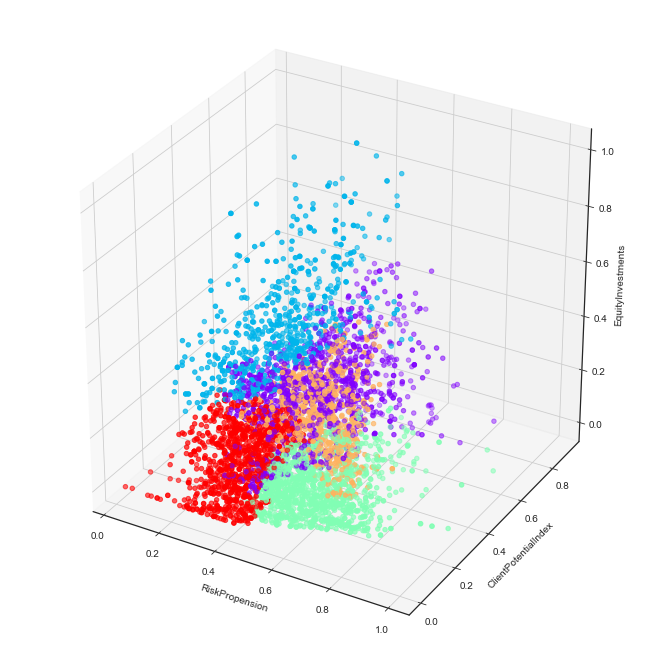

In [134]:
fig = plt.figure(figsize=(9,9))
ax = Axes3D(fig)
ax.scatter(dfward['RiskPropension'].values, dfward['ClientPotentialIndex'].values, dfward['EquityInvestments'].values, c=cluster.labels_, cmap='rainbow', label = cluster.labels_)
ax.set_xlabel('RiskPropension')
ax.set_ylabel('ClientPotentialIndex')
ax.set_zlabel('EquityInvestments')

#### Ovvie differenze con il K-Means (a partire dal numero cluster) che commenteremo nel paper

-------------------------------------------

## Proviamo a creare dei modelli per prevedere la variabile continua [0,1] EquityInvestment

In [5]:
le = LabelEncoder()

le.fit(list(df['Prov'].values))
df['Prov'] = le.transform(list(df['Prov'].values))

In [6]:
columns = df.columns
for i in columns:
    print(df[i].describe())
    print("\n")

count           5000
unique          5000
top       Client4132
freq               1
Name: ClientID, dtype: object


count    5000.000000
mean        0.488939
std         0.130907
min         0.031131
25%         0.388924
50%         0.476067
75%         0.581871
max         1.000000
Name: RiskPropension, dtype: float64


count    5000.000000
mean        0.047734
std         0.047463
min         0.000000
25%         0.026103
50%         0.042425
75%         0.059148
max         1.000000
Name: PortfolioRisk, dtype: float64


count    5000.000000
mean       12.536004
std         8.178925
min         0.676500
25%         6.970000
50%        10.207220
75%        15.788751
max        73.424345
Name: ClientInvestmentHorizon, dtype: float64


count    5000.000000
mean        2.340548
std         1.836560
min         0.500000
25%         1.078800
50%         2.000000
75%         3.203675
max        40.330173
Name: PortfolioHorizon, dtype: float64


count    5000.000000
mean        0.619686
std 

In [7]:
df.shape

(5000, 25)

Rimuovo la variabile target e clientID dal dataframe

In [8]:
y = df.EquityInvestments.values
df.drop('EquityInvestments', axis = 1, inplace= True)
clientid = df.ClientID.values
df.drop('ClientID', axis=1, inplace=True)

In [9]:
df.shape

(5000, 23)

Tolgo le variabili che sono complemento a 1 con EquityInvestments e quelle che sono ricavate dalla composizione del portafoglio, e che quindi introdurrebbero un bias nel modello

In [10]:
col = ['BondInvestments', 'MoneyMarketInvestments', 'OtherInvestments', 'PortfolioRisk', 'PortfolioHorizon']
df.drop(col, axis=1, inplace=True)

In [11]:
df.shape

(5000, 18)

In [12]:
df.columns

Index(['RiskPropension', 'ClientInvestmentHorizon',
       'ClientKnowledgeExperience', 'ClientPotentialIndex', 'IncomeHighLow',
       'Sex', 'AuM', 'Age', 'IncomeNeed', 'LongTermCareNeed', 'ProtectionNeed',
       'PensionNeed', 'InheritanceIndex', 'PanicMood', 'ClientDateStart',
       'NoTrustInBanks', 'Prov', 'Cash'],
      dtype='object')

In [13]:
x_train, x_test, y_train, y_test = train_test_split(df, y, test_size=0.2, random_state=123)

In [14]:
print('Train size: {}\nTest size: {}'.format(x_train.shape, x_test.shape))

Train size: (4000, 18)
Test size: (1000, 18)


### Controlliamo che lo split non abbia cambiato la distribuzione, tra train e test, della variabile target

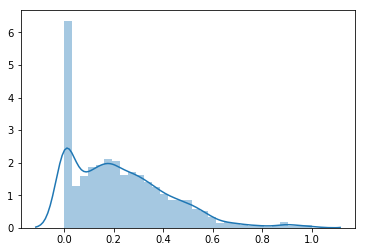

In [15]:
sns.distplot(y)

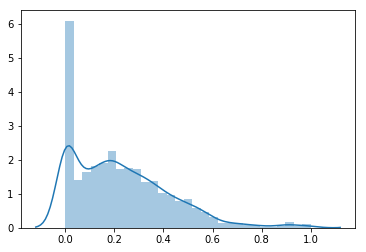

In [16]:
sns.distplot(y_train)

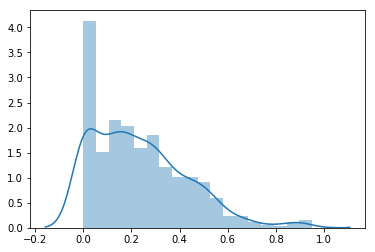

In [17]:
sns.distplot(y_test)

### Extra Tree Regressor

In [18]:
etr = ExtraTreesRegressor()
etr.fit(x_train, y_train)

ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=None,
          max_features='auto', max_leaf_nodes=None,
          min_impurity_decrease=0.0, min_impurity_split=None,
          min_samples_leaf=1, min_samples_split=2,
          min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
          oob_score=False, random_state=None, verbose=0, warm_start=False)

In [19]:
fimp = etr.feature_importances_
col = x_train.columns
d = {'features': col}
d = pd.DataFrame(d)
d['importance'] = fimp
d = d.sort_values('importance', ascending= False)[:10]  #Printo le 10 features più importanti
d

,features,importance
10,ProtectionNeed,0.498236
17,Cash,0.158160
7,Age,0.048961
1,ClientInvestmentHorizon,0.047098
0,RiskPropension,0.043682
2,ClientKnowledgeExperience,0.027582
11,PensionNeed,0.025408
3,ClientPotentialIndex,0.019740
16,Prov,0.018156
9,LongTermCareNeed,0.017634


Tengo solo le variabili rilevanti per il modello

In [20]:
feat = list(d['features'])
x_train2 = x_train[feat]
x_test2 = x_test[feat]
print('Train size: {}\nTest size: {}'.format(x_train2.shape, x_test2.shape))

Train size: (4000, 10)
Test size: (1000, 10)


Per l'hypertuning dei parametri si utilizzerà randomized search cv, che campiona valori casuali da delle distribuzioni e li usa come hyperparametri, viene effettuata poi una Cross Validation con k = 5 per ogni combinazione di parametri

In [21]:
#Creo la funzione per effettuare hypertuning dei parametri
def hypertuning_rscv(mod, p_distr, nbr_iter,X,y):
    rdmsearch = RandomizedSearchCV(mod, param_distributions=p_distr,
                                   n_jobs=-1, n_iter=nbr_iter, scoring = 'neg_mean_absolute_error',
                                   cv=5) 
    #KFoldsCV con K=5
    start = time()
    rdmsearch.fit(X,y)
    print('hyper-tuning time : %d seconds' % (time()-start))
    start = 0
    ht_cvresults = rdmsearch.cv_results_
    ht_params = rdmsearch.best_params_
    ht_score = rdmsearch.best_score_
    return ht_params, ht_score, ht_cvresults

In [22]:
param_dist = {'n_estimators': randint(5, 1000), 'max_depth': randint(5, 1000)}

In [23]:
etr = ExtraTreesRegressor()
model_params, model_best_score, cv_results = hypertuning_rscv(etr, param_dist, 50, x_train2, y_train)

hyper-tuning time : 497 seconds


In [24]:
model_params

{'max_depth': 747, 'n_estimators': 930}

In [25]:
model_best_score*-1

0.07219363693820229

In [26]:
etr = ExtraTreesRegressor(n_estimators=138, max_depth=644)
mae = cross_val_score(etr, x_train2, y_train, cv = 5, scoring='neg_mean_absolute_error')
mae*-1

array([0.06869585, 0.07178404, 0.07594948, 0.07454847, 0.07125758])

In [27]:
print((mae*-1).mean())

0.07244708140019468


In [28]:
tempo = time()
etr.fit(x_train2, y_train)
final = time() - tempo

In [29]:
print('Trainig time: {} s'.format(final))

Trainig time: 1.2653093338012695 s


### Results on test:

In [30]:
pred = etr.predict(x_test2)
print('mse: {}\nmae: {}'.format(mean_squared_error(y_test, pred), mean_absolute_error(y_test, pred)))

mse: 0.011435412902732383
mae: 0.07294188604363233


#### RandomForest Regressor

In [31]:
rfr = RandomForestRegressor()
rfr = rfr.fit(x_train, y_train)

In [32]:
fimp = rfr.feature_importances_
col = x_train.columns
d = {'features': col}
d = pd.DataFrame(d)
d['importance'] = fimp
d = d.sort_values('importance', ascending= False)[:10]  #Prendo solo le 10 features più importanti
d

,features,importance
10,ProtectionNeed,0.617885
17,Cash,0.076545
1,ClientInvestmentHorizon,0.069998
0,RiskPropension,0.049497
6,AuM,0.029184
7,Age,0.024603
11,PensionNeed,0.021849
8,IncomeNeed,0.017047
9,LongTermCareNeed,0.016911
2,ClientKnowledgeExperience,0.016313


In [33]:
feat = list(d['features'])
x_train2 = x_train[feat]
x_test2 = x_test[feat]

In [34]:
param_dist = {'n_estimators': randint(5, 1000), 'max_depth': randint(5, 1000)}

In [35]:
model_params, model_best_score, cv_results = hypertuning_rscv(etr, param_dist, 50, x_train2, y_train)

hyper-tuning time : 448 seconds


In [36]:
model_params

{'max_depth': 184, 'n_estimators': 179}

In [37]:
model_best_score*-1

0.07247230184897777

In [38]:
rfr = RandomForestRegressor(max_depth=259, n_estimators=433)
mae = cross_val_score(rfr, x_train2, y_train, cv = 5, scoring='neg_mean_absolute_error')
mae*-1

array([0.06898068, 0.06989798, 0.07546733, 0.07526553, 0.07230511])

In [39]:
print((mae*-1).mean())

0.0723833250797914


In [40]:
tempo = time()
rfr.fit(x_train2, y_train)
final = time() - tempo

In [41]:
print('Trainig time: {} s'.format(final))

Trainig time: 8.591722011566162 s


### Results on test

In [42]:
pred = rfr.predict(x_test2)
print('mse: {}\nmae: {}'.format(mean_squared_error(y_test, pred), mean_absolute_error(y_test, pred)))

mse: 0.01100334801315234
mae: 0.07229686399513863


### Deep model

In [43]:
x_train.shape

(4000, 18)

In [44]:
y.shape

(5000,)

In [45]:
df_scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))
x_train_scaled = df_scaler.fit_transform(x_train)
x_test_scaled = df_scaler.fit_transform(x_test)

In [46]:
x_train_scaled.shape

(4000, 18)

In [47]:
x_test_scaled.shape

(1000, 18)

### Network

In [48]:
model = Sequential()

model.add(layers.Dense(64, input_dim=18, activation='relu'))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(16, activation='relu'))
model.add(Dropout(0.1))
model.add(layers.Dense(8, activation='relu'))
model.add(layers.Dense(4, activation='relu'))
model.add(layers.Dense(2, activation='relu'))
model.add(layers.Dense(1))

In [49]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 64)                1216      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 16)                528       
_________________________________________________________________
dropout_1 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_5 (Dense)              (None, 4)                 36        
_________________________________________________________________
dense_6 (Dense)              (None, 2)                 10        
__________

In [50]:
model.compile(optimizer=optimizers.SGD(lr=0.001, momentum=0.0, decay=0.00001), 
                loss='mae', metrics=['mse'])

In [51]:
from keras.callbacks import ModelCheckpoint

In [52]:
best_weights = 'best_weights.h5'
modelckp = ModelCheckpoint(best_weights, monitor= 'val_loss', save_best_only=True, verbose = 1)

In [53]:
tempo = time()
history = model.fit(x_train_scaled, y_train,
                      batch_size = 100, epochs = 2000,
                      verbose = 1, validation_data = (x_test_scaled,y_test),
                      callbacks= [modelckp])

Train on 4000 samples, validate on 1000 samples
Epoch 1/2000
4000/4000 [==============================] - 2s 625us/step - loss: 0.2056 - mean_squared_error: 0.0768 - val_loss: 0.1958 - val_mean_squared_error: 0.0690

Epoch 00001: val_loss improved from inf to 0.19578, saving model to best_weights.h5
Epoch 2/2000
4000/4000 [==============================] - 0s 78us/step - loss: 0.1830 - mean_squared_error: 0.0618 - val_loss: 0.1752 - val_mean_squared_error: 0.0560

Epoch 00002: val_loss improved from 0.19578 to 0.17523, saving model to best_weights.h5
Epoch 3/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1694 - mean_squared_error: 0.0525 - val_loss: 0.1647 - val_mean_squared_error: 0.0487

Epoch 00003: val_loss improved from 0.17523 to 0.16471, saving model to best_weights.h5
Epoch 4/2000
4000/4000 [==============================] - 0s 78us/step - loss: 0.1623 - mean_squared_error: 0.0473 - val_loss: 0.1595 - val_mean_squared_error: 0.0446

Epoch 00004: val_lo

Epoch 33/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1509 - mean_squared_error: 0.0385 - val_loss: 0.1496 - val_mean_squared_error: 0.0370

Epoch 00033: val_loss improved from 0.14968 to 0.14956, saving model to best_weights.h5
Epoch 34/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1498 - mean_squared_error: 0.0381 - val_loss: 0.1494 - val_mean_squared_error: 0.0369

Epoch 00034: val_loss improved from 0.14956 to 0.14943, saving model to best_weights.h5
Epoch 35/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1498 - mean_squared_error: 0.0381 - val_loss: 0.1493 - val_mean_squared_error: 0.0369

Epoch 00035: val_loss improved from 0.14943 to 0.14931, saving model to best_weights.h5
Epoch 36/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1501 - mean_squared_error: 0.0382 - val_loss: 0.1492 - val_mean_squared_error: 0.0368

Epoch 00036: val_loss improved from 0.14931 to 0.14920, savi

4000/4000 [==============================] - 0s 70us/step - loss: 0.1470 - mean_squared_error: 0.0371 - val_loss: 0.1460 - val_mean_squared_error: 0.0357

Epoch 00065: val_loss improved from 0.14612 to 0.14599, saving model to best_weights.h5
Epoch 66/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1466 - mean_squared_error: 0.0372 - val_loss: 0.1459 - val_mean_squared_error: 0.0356

Epoch 00066: val_loss improved from 0.14599 to 0.14588, saving model to best_weights.h5
Epoch 67/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1469 - mean_squared_error: 0.0373 - val_loss: 0.1458 - val_mean_squared_error: 0.0356

Epoch 00067: val_loss improved from 0.14588 to 0.14576, saving model to best_weights.h5
Epoch 68/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1469 - mean_squared_error: 0.0373 - val_loss: 0.1457 - val_mean_squared_error: 0.0355

Epoch 00068: val_loss improved from 0.14576 to 0.14565, saving model to be

Epoch 97/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1428 - mean_squared_error: 0.0360 - val_loss: 0.1422 - val_mean_squared_error: 0.0345

Epoch 00097: val_loss improved from 0.14236 to 0.14224, saving model to best_weights.h5
Epoch 98/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1429 - mean_squared_error: 0.0361 - val_loss: 0.1421 - val_mean_squared_error: 0.0344

Epoch 00098: val_loss improved from 0.14224 to 0.14212, saving model to best_weights.h5
Epoch 99/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1429 - mean_squared_error: 0.0360 - val_loss: 0.1420 - val_mean_squared_error: 0.0344

Epoch 00099: val_loss improved from 0.14212 to 0.14201, saving model to best_weights.h5
Epoch 100/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1429 - mean_squared_error: 0.0359 - val_loss: 0.1419 - val_mean_squared_error: 0.0343

Epoch 00100: val_loss improved from 0.14201 to 0.14189, sav

4000/4000 [==============================] - 0s 62us/step - loss: 0.1393 - mean_squared_error: 0.0350 - val_loss: 0.1386 - val_mean_squared_error: 0.0332

Epoch 00129: val_loss improved from 0.13869 to 0.13859, saving model to best_weights.h5
Epoch 130/2000
4000/4000 [==============================] - 0s 82us/step - loss: 0.1386 - mean_squared_error: 0.0347 - val_loss: 0.1385 - val_mean_squared_error: 0.0332

Epoch 00130: val_loss improved from 0.13859 to 0.13848, saving model to best_weights.h5
Epoch 131/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1387 - mean_squared_error: 0.0347 - val_loss: 0.1384 - val_mean_squared_error: 0.0332

Epoch 00131: val_loss improved from 0.13848 to 0.13835, saving model to best_weights.h5
Epoch 132/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1380 - mean_squared_error: 0.0343 - val_loss: 0.1382 - val_mean_squared_error: 0.0331

Epoch 00132: val_loss improved from 0.13835 to 0.13824, saving model to

4000/4000 [==============================] - 0s 66us/step - loss: 0.1346 - mean_squared_error: 0.0332 - val_loss: 0.1350 - val_mean_squared_error: 0.0322

Epoch 00161: val_loss improved from 0.13514 to 0.13502, saving model to best_weights.h5
Epoch 162/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1357 - mean_squared_error: 0.0337 - val_loss: 0.1349 - val_mean_squared_error: 0.0322

Epoch 00162: val_loss improved from 0.13502 to 0.13492, saving model to best_weights.h5
Epoch 163/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1350 - mean_squared_error: 0.0338 - val_loss: 0.1348 - val_mean_squared_error: 0.0322

Epoch 00163: val_loss improved from 0.13492 to 0.13480, saving model to best_weights.h5
Epoch 164/2000
4000/4000 [==============================] - 0s 67us/step - loss: 0.1347 - mean_squared_error: 0.0334 - val_loss: 0.1347 - val_mean_squared_error: 0.0322

Epoch 00164: val_loss improved from 0.13480 to 0.13470, saving model to

Epoch 193/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1312 - mean_squared_error: 0.0324 - val_loss: 0.1317 - val_mean_squared_error: 0.0314

Epoch 00193: val_loss improved from 0.13176 to 0.13166, saving model to best_weights.h5
Epoch 194/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1324 - mean_squared_error: 0.0326 - val_loss: 0.1316 - val_mean_squared_error: 0.0313

Epoch 00194: val_loss improved from 0.13166 to 0.13157, saving model to best_weights.h5
Epoch 195/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1315 - mean_squared_error: 0.0324 - val_loss: 0.1315 - val_mean_squared_error: 0.0313

Epoch 00195: val_loss improved from 0.13157 to 0.13147, saving model to best_weights.h5
Epoch 196/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1313 - mean_squared_error: 0.0325 - val_loss: 0.1314 - val_mean_squared_error: 0.0312

Epoch 00196: val_loss improved from 0.13147 to 0.13136, 

4000/4000 [==============================] - 0s 82us/step - loss: 0.1286 - mean_squared_error: 0.0310 - val_loss: 0.1292 - val_mean_squared_error: 0.0302

Epoch 00225: val_loss improved from 0.12931 to 0.12923, saving model to best_weights.h5
Epoch 226/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1299 - mean_squared_error: 0.0313 - val_loss: 0.1292 - val_mean_squared_error: 0.0303

Epoch 00226: val_loss improved from 0.12923 to 0.12917, saving model to best_weights.h5
Epoch 227/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1292 - mean_squared_error: 0.0314 - val_loss: 0.1291 - val_mean_squared_error: 0.0302

Epoch 00227: val_loss improved from 0.12917 to 0.12912, saving model to best_weights.h5
Epoch 228/2000
4000/4000 [==============================] - 0s 76us/step - loss: 0.1300 - mean_squared_error: 0.0317 - val_loss: 0.1290 - val_mean_squared_error: 0.0302

Epoch 00228: val_loss improved from 0.12912 to 0.12905, saving model to

Epoch 257/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1284 - mean_squared_error: 0.0305 - val_loss: 0.1272 - val_mean_squared_error: 0.0293

Epoch 00257: val_loss improved from 0.12728 to 0.12723, saving model to best_weights.h5
Epoch 258/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1276 - mean_squared_error: 0.0306 - val_loss: 0.1272 - val_mean_squared_error: 0.0293

Epoch 00258: val_loss improved from 0.12723 to 0.12720, saving model to best_weights.h5
Epoch 259/2000
4000/4000 [==============================] - 0s 75us/step - loss: 0.1276 - mean_squared_error: 0.0303 - val_loss: 0.1271 - val_mean_squared_error: 0.0293

Epoch 00259: val_loss improved from 0.12720 to 0.12715, saving model to best_weights.h5
Epoch 260/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1272 - mean_squared_error: 0.0304 - val_loss: 0.1271 - val_mean_squared_error: 0.0292

Epoch 00260: val_loss improved from 0.12715 to 0.12709, 

4000/4000 [==============================] - 0s 74us/step - loss: 0.1249 - mean_squared_error: 0.0294 - val_loss: 0.1252 - val_mean_squared_error: 0.0284

Epoch 00289: val_loss improved from 0.12527 to 0.12518, saving model to best_weights.h5
Epoch 290/2000
4000/4000 [==============================] - 0s 79us/step - loss: 0.1256 - mean_squared_error: 0.0296 - val_loss: 0.1251 - val_mean_squared_error: 0.0284

Epoch 00290: val_loss improved from 0.12518 to 0.12510, saving model to best_weights.h5
Epoch 291/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1248 - mean_squared_error: 0.0293 - val_loss: 0.1251 - val_mean_squared_error: 0.0284

Epoch 00291: val_loss improved from 0.12510 to 0.12506, saving model to best_weights.h5
Epoch 292/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1248 - mean_squared_error: 0.0293 - val_loss: 0.1250 - val_mean_squared_error: 0.0284

Epoch 00292: val_loss improved from 0.12506 to 0.12501, saving model to

4000/4000 [==============================] - 0s 62us/step - loss: 0.1233 - mean_squared_error: 0.0284 - val_loss: 0.1236 - val_mean_squared_error: 0.0277

Epoch 00321: val_loss improved from 0.12364 to 0.12359, saving model to best_weights.h5
Epoch 322/2000
4000/4000 [==============================] - 0s 71us/step - loss: 0.1234 - mean_squared_error: 0.0284 - val_loss: 0.1236 - val_mean_squared_error: 0.0277

Epoch 00322: val_loss improved from 0.12359 to 0.12356, saving model to best_weights.h5
Epoch 323/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1236 - mean_squared_error: 0.0286 - val_loss: 0.1235 - val_mean_squared_error: 0.0276

Epoch 00323: val_loss improved from 0.12356 to 0.12351, saving model to best_weights.h5
Epoch 324/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1237 - mean_squared_error: 0.0286 - val_loss: 0.1235 - val_mean_squared_error: 0.0276

Epoch 00324: val_loss improved from 0.12351 to 0.12347, saving model to

Epoch 385/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1209 - mean_squared_error: 0.0274 - val_loss: 0.1215 - val_mean_squared_error: 0.0266

Epoch 00385: val_loss improved from 0.12151 to 0.12149, saving model to best_weights.h5
Epoch 386/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1213 - mean_squared_error: 0.0275 - val_loss: 0.1215 - val_mean_squared_error: 0.0266

Epoch 00386: val_loss improved from 0.12149 to 0.12146, saving model to best_weights.h5
Epoch 387/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1213 - mean_squared_error: 0.0275 - val_loss: 0.1214 - val_mean_squared_error: 0.0266

Epoch 00387: val_loss improved from 0.12146 to 0.12144, saving model to best_weights.h5
Epoch 388/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1209 - mean_squared_error: 0.0274 - val_loss: 0.1214 - val_mean_squared_error: 0.0267

Epoch 00388: val_loss improved from 0.12144 to 0.12140, 

4000/4000 [==============================] - 0s 59us/step - loss: 0.1201 - mean_squared_error: 0.0268 - val_loss: 0.1206 - val_mean_squared_error: 0.0263

Epoch 00417: val_loss improved from 0.12063 to 0.12059, saving model to best_weights.h5
Epoch 418/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1204 - mean_squared_error: 0.0269 - val_loss: 0.1206 - val_mean_squared_error: 0.0262

Epoch 00418: val_loss improved from 0.12059 to 0.12056, saving model to best_weights.h5
Epoch 419/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1189 - mean_squared_error: 0.0267 - val_loss: 0.1205 - val_mean_squared_error: 0.0262

Epoch 00419: val_loss improved from 0.12056 to 0.12053, saving model to best_weights.h5
Epoch 420/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1198 - mean_squared_error: 0.0266 - val_loss: 0.1205 - val_mean_squared_error: 0.0262

Epoch 00420: val_loss improved from 0.12053 to 0.12052, saving model to

4000/4000 [==============================] - 0s 66us/step - loss: 0.1189 - mean_squared_error: 0.0263 - val_loss: 0.1199 - val_mean_squared_error: 0.0259

Epoch 00449: val_loss did not improve from 0.11987
Epoch 450/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1201 - mean_squared_error: 0.0268 - val_loss: 0.1198 - val_mean_squared_error: 0.0259

Epoch 00450: val_loss improved from 0.11987 to 0.11985, saving model to best_weights.h5
Epoch 451/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1197 - mean_squared_error: 0.0267 - val_loss: 0.1198 - val_mean_squared_error: 0.0259

Epoch 00451: val_loss improved from 0.11985 to 0.11984, saving model to best_weights.h5
Epoch 452/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1184 - mean_squared_error: 0.0263 - val_loss: 0.1198 - val_mean_squared_error: 0.0259

Epoch 00452: val_loss improved from 0.11984 to 0.11983, saving model to best_weights.h5
Epoch 453/2000
4000/

4000/4000 [==============================] - 0s 70us/step - loss: 0.1177 - mean_squared_error: 0.0259 - val_loss: 0.1188 - val_mean_squared_error: 0.0255

Epoch 00513: val_loss did not improve from 0.11879
Epoch 514/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1187 - mean_squared_error: 0.0263 - val_loss: 0.1188 - val_mean_squared_error: 0.0255

Epoch 00514: val_loss improved from 0.11879 to 0.11879, saving model to best_weights.h5
Epoch 515/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1175 - mean_squared_error: 0.0257 - val_loss: 0.1188 - val_mean_squared_error: 0.0255

Epoch 00515: val_loss improved from 0.11879 to 0.11875, saving model to best_weights.h5
Epoch 516/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1181 - mean_squared_error: 0.0262 - val_loss: 0.1187 - val_mean_squared_error: 0.0255

Epoch 00516: val_loss improved from 0.11875 to 0.11873, saving model to best_weights.h5
Epoch 517/2000
4000/

Epoch 546/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1175 - mean_squared_error: 0.0258 - val_loss: 0.1183 - val_mean_squared_error: 0.0253

Epoch 00546: val_loss improved from 0.11831 to 0.11829, saving model to best_weights.h5
Epoch 547/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1175 - mean_squared_error: 0.0256 - val_loss: 0.1183 - val_mean_squared_error: 0.0253

Epoch 00547: val_loss improved from 0.11829 to 0.11827, saving model to best_weights.h5
Epoch 548/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1177 - mean_squared_error: 0.0260 - val_loss: 0.1183 - val_mean_squared_error: 0.0253

Epoch 00548: val_loss improved from 0.11827 to 0.11826, saving model to best_weights.h5
Epoch 549/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1173 - mean_squared_error: 0.0258 - val_loss: 0.1182 - val_mean_squared_error: 0.0253

Epoch 00549: val_loss improved from 0.11826 to 0.11824, 

4000/4000 [==============================] - 0s 59us/step - loss: 0.1171 - mean_squared_error: 0.0255 - val_loss: 0.1179 - val_mean_squared_error: 0.0251

Epoch 00579: val_loss did not improve from 0.11791
Epoch 580/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1168 - mean_squared_error: 0.0254 - val_loss: 0.1179 - val_mean_squared_error: 0.0251

Epoch 00580: val_loss improved from 0.11791 to 0.11788, saving model to best_weights.h5
Epoch 581/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1172 - mean_squared_error: 0.0255 - val_loss: 0.1179 - val_mean_squared_error: 0.0251

Epoch 00581: val_loss improved from 0.11788 to 0.11786, saving model to best_weights.h5
Epoch 582/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1166 - mean_squared_error: 0.0254 - val_loss: 0.1179 - val_mean_squared_error: 0.0251

Epoch 00582: val_loss did not improve from 0.11786
Epoch 583/2000
4000/4000 [==============================]

4000/4000 [==============================] - 0s 66us/step - loss: 0.1152 - mean_squared_error: 0.0248 - val_loss: 0.1171 - val_mean_squared_error: 0.0247

Epoch 00646: val_loss improved from 0.11714 to 0.11711, saving model to best_weights.h5
Epoch 647/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1148 - mean_squared_error: 0.0246 - val_loss: 0.1172 - val_mean_squared_error: 0.0247

Epoch 00647: val_loss did not improve from 0.11711
Epoch 648/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1162 - mean_squared_error: 0.0251 - val_loss: 0.1171 - val_mean_squared_error: 0.0247

Epoch 00648: val_loss did not improve from 0.11711
Epoch 649/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1154 - mean_squared_error: 0.0250 - val_loss: 0.1171 - val_mean_squared_error: 0.0247

Epoch 00649: val_loss improved from 0.11711 to 0.11711, saving model to best_weights.h5
Epoch 650/2000
4000/4000 [==============================]

4000/4000 [==============================] - 0s 74us/step - loss: 0.1150 - mean_squared_error: 0.0248 - val_loss: 0.1167 - val_mean_squared_error: 0.0245

Epoch 00680: val_loss improved from 0.11675 to 0.11674, saving model to best_weights.h5
Epoch 681/2000
4000/4000 [==============================] - 0s 78us/step - loss: 0.1143 - mean_squared_error: 0.0243 - val_loss: 0.1167 - val_mean_squared_error: 0.0245

Epoch 00681: val_loss improved from 0.11674 to 0.11672, saving model to best_weights.h5
Epoch 682/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1150 - mean_squared_error: 0.0247 - val_loss: 0.1168 - val_mean_squared_error: 0.0245

Epoch 00682: val_loss did not improve from 0.11672
Epoch 683/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1153 - mean_squared_error: 0.0246 - val_loss: 0.1167 - val_mean_squared_error: 0.0245

Epoch 00683: val_loss improved from 0.11672 to 0.11671, saving model to best_weights.h5
Epoch 684/2000
4000/


Epoch 00713: val_loss improved from 0.11639 to 0.11636, saving model to best_weights.h5
Epoch 714/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1141 - mean_squared_error: 0.0243 - val_loss: 0.1164 - val_mean_squared_error: 0.0243

Epoch 00714: val_loss improved from 0.11636 to 0.11635, saving model to best_weights.h5
Epoch 715/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1136 - mean_squared_error: 0.0243 - val_loss: 0.1163 - val_mean_squared_error: 0.0243

Epoch 00715: val_loss improved from 0.11635 to 0.11634, saving model to best_weights.h5
Epoch 716/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1142 - mean_squared_error: 0.0244 - val_loss: 0.1163 - val_mean_squared_error: 0.0243

Epoch 00716: val_loss did not improve from 0.11634
Epoch 717/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1145 - mean_squared_error: 0.0243 - val_loss: 0.1163 - val_mean_squared_error: 0.0243

Epoc


Epoch 00747: val_loss improved from 0.11593 to 0.11592, saving model to best_weights.h5
Epoch 748/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1134 - mean_squared_error: 0.0240 - val_loss: 0.1159 - val_mean_squared_error: 0.0241

Epoch 00748: val_loss did not improve from 0.11592
Epoch 749/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1138 - mean_squared_error: 0.0242 - val_loss: 0.1159 - val_mean_squared_error: 0.0241

Epoch 00749: val_loss did not improve from 0.11592
Epoch 750/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1141 - mean_squared_error: 0.0244 - val_loss: 0.1159 - val_mean_squared_error: 0.0241

Epoch 00750: val_loss improved from 0.11592 to 0.11592, saving model to best_weights.h5
Epoch 751/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1141 - mean_squared_error: 0.0245 - val_loss: 0.1159 - val_mean_squared_error: 0.0241

Epoch 00751: val_loss improved from 0.115

4000/4000 [==============================] - 0s 82us/step - loss: 0.1135 - mean_squared_error: 0.0239 - val_loss: 0.1156 - val_mean_squared_error: 0.0240

Epoch 00782: val_loss did not improve from 0.11559
Epoch 783/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1142 - mean_squared_error: 0.0242 - val_loss: 0.1156 - val_mean_squared_error: 0.0240

Epoch 00783: val_loss improved from 0.11559 to 0.11559, saving model to best_weights.h5
Epoch 784/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1132 - mean_squared_error: 0.0240 - val_loss: 0.1156 - val_mean_squared_error: 0.0240

Epoch 00784: val_loss did not improve from 0.11559
Epoch 785/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1140 - mean_squared_error: 0.0240 - val_loss: 0.1156 - val_mean_squared_error: 0.0240

Epoch 00785: val_loss improved from 0.11559 to 0.11557, saving model to best_weights.h5
Epoch 786/2000
4000/4000 [==============================]

Epoch 816/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1127 - mean_squared_error: 0.0237 - val_loss: 0.1152 - val_mean_squared_error: 0.0238

Epoch 00816: val_loss improved from 0.11516 to 0.11516, saving model to best_weights.h5
Epoch 817/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1129 - mean_squared_error: 0.0239 - val_loss: 0.1152 - val_mean_squared_error: 0.0238

Epoch 00817: val_loss did not improve from 0.11516
Epoch 818/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1137 - mean_squared_error: 0.0241 - val_loss: 0.1152 - val_mean_squared_error: 0.0238

Epoch 00818: val_loss did not improve from 0.11516
Epoch 819/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1133 - mean_squared_error: 0.0239 - val_loss: 0.1151 - val_mean_squared_error: 0.0238

Epoch 00819: val_loss improved from 0.11516 to 0.11512, saving model to best_weights.h5
Epoch 820/2000
4000/4000 [================


Epoch 00884: val_loss improved from 0.11442 to 0.11442, saving model to best_weights.h5
Epoch 885/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1128 - mean_squared_error: 0.0235 - val_loss: 0.1144 - val_mean_squared_error: 0.0235

Epoch 00885: val_loss improved from 0.11442 to 0.11441, saving model to best_weights.h5
Epoch 886/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1122 - mean_squared_error: 0.0234 - val_loss: 0.1144 - val_mean_squared_error: 0.0235

Epoch 00886: val_loss improved from 0.11441 to 0.11441, saving model to best_weights.h5
Epoch 887/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1121 - mean_squared_error: 0.0234 - val_loss: 0.1144 - val_mean_squared_error: 0.0235

Epoch 00887: val_loss did not improve from 0.11441
Epoch 888/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1113 - mean_squared_error: 0.0232 - val_loss: 0.1144 - val_mean_squared_error: 0.0235

Epoc


Epoch 00918: val_loss did not improve from 0.11396
Epoch 919/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1115 - mean_squared_error: 0.0232 - val_loss: 0.1140 - val_mean_squared_error: 0.0233

Epoch 00919: val_loss did not improve from 0.11396
Epoch 920/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1117 - mean_squared_error: 0.0232 - val_loss: 0.1140 - val_mean_squared_error: 0.0233

Epoch 00920: val_loss did not improve from 0.11396
Epoch 921/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1124 - mean_squared_error: 0.0233 - val_loss: 0.1139 - val_mean_squared_error: 0.0233

Epoch 00921: val_loss improved from 0.11396 to 0.11392, saving model to best_weights.h5
Epoch 922/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1116 - mean_squared_error: 0.0235 - val_loss: 0.1139 - val_mean_squared_error: 0.0233

Epoch 00922: val_loss improved from 0.11392 to 0.11392, saving model to best_w

4000/4000 [==============================] - 0s 70us/step - loss: 0.1113 - mean_squared_error: 0.0231 - val_loss: 0.1132 - val_mean_squared_error: 0.0230

Epoch 00988: val_loss did not improve from 0.11316
Epoch 989/2000
4000/4000 [==============================] - 0s 67us/step - loss: 0.1112 - mean_squared_error: 0.0230 - val_loss: 0.1132 - val_mean_squared_error: 0.0230

Epoch 00989: val_loss did not improve from 0.11316
Epoch 990/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1115 - mean_squared_error: 0.0230 - val_loss: 0.1132 - val_mean_squared_error: 0.0230

Epoch 00990: val_loss did not improve from 0.11316
Epoch 991/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1116 - mean_squared_error: 0.0232 - val_loss: 0.1131 - val_mean_squared_error: 0.0230

Epoch 00991: val_loss improved from 0.11316 to 0.11311, saving model to best_weights.h5
Epoch 992/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1106 - mean

4000/4000 [==============================] - 0s 70us/step - loss: 0.1106 - mean_squared_error: 0.0229 - val_loss: 0.1128 - val_mean_squared_error: 0.0228

Epoch 01023: val_loss improved from 0.11277 to 0.11276, saving model to best_weights.h5
Epoch 1024/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1112 - mean_squared_error: 0.0228 - val_loss: 0.1128 - val_mean_squared_error: 0.0228

Epoch 01024: val_loss did not improve from 0.11276
Epoch 1025/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1106 - mean_squared_error: 0.0227 - val_loss: 0.1127 - val_mean_squared_error: 0.0228

Epoch 01025: val_loss improved from 0.11276 to 0.11275, saving model to best_weights.h5
Epoch 1026/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1110 - mean_squared_error: 0.0228 - val_loss: 0.1127 - val_mean_squared_error: 0.0228

Epoch 01026: val_loss improved from 0.11275 to 0.11271, saving model to best_weights.h5
Epoch 1027/2000
4

4000/4000 [==============================] - 0s 55us/step - loss: 0.1102 - mean_squared_error: 0.0225 - val_loss: 0.1120 - val_mean_squared_error: 0.0224

Epoch 01092: val_loss did not improve from 0.11187
Epoch 1093/2000
4000/4000 [==============================] - 0s 51us/step - loss: 0.1104 - mean_squared_error: 0.0224 - val_loss: 0.1118 - val_mean_squared_error: 0.0225

Epoch 01093: val_loss improved from 0.11187 to 0.11180, saving model to best_weights.h5
Epoch 1094/2000
4000/4000 [==============================] - 0s 55us/step - loss: 0.1105 - mean_squared_error: 0.0227 - val_loss: 0.1119 - val_mean_squared_error: 0.0224

Epoch 01094: val_loss did not improve from 0.11180
Epoch 1095/2000
4000/4000 [==============================] - 0s 51us/step - loss: 0.1099 - mean_squared_error: 0.0222 - val_loss: 0.1118 - val_mean_squared_error: 0.0225

Epoch 01095: val_loss improved from 0.11180 to 0.11177, saving model to best_weights.h5
Epoch 1096/2000
4000/4000 [===========================


Epoch 01127: val_loss did not improve from 0.11144
Epoch 1128/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1093 - mean_squared_error: 0.0221 - val_loss: 0.1114 - val_mean_squared_error: 0.0223

Epoch 01128: val_loss improved from 0.11144 to 0.11143, saving model to best_weights.h5
Epoch 1129/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1098 - mean_squared_error: 0.0221 - val_loss: 0.1114 - val_mean_squared_error: 0.0223

Epoch 01129: val_loss improved from 0.11143 to 0.11140, saving model to best_weights.h5
Epoch 1130/2000
4000/4000 [==============================] - 0s 71us/step - loss: 0.1095 - mean_squared_error: 0.0221 - val_loss: 0.1114 - val_mean_squared_error: 0.0223

Epoch 01130: val_loss improved from 0.11140 to 0.11137, saving model to best_weights.h5
Epoch 1131/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1104 - mean_squared_error: 0.0227 - val_loss: 0.1114 - val_mean_squared_error: 0.0223



Epoch 1162/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1091 - mean_squared_error: 0.0219 - val_loss: 0.1110 - val_mean_squared_error: 0.0221

Epoch 01162: val_loss improved from 0.11099 to 0.11097, saving model to best_weights.h5
Epoch 1163/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1095 - mean_squared_error: 0.0223 - val_loss: 0.1109 - val_mean_squared_error: 0.0221

Epoch 01163: val_loss improved from 0.11097 to 0.11091, saving model to best_weights.h5
Epoch 1164/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1092 - mean_squared_error: 0.0222 - val_loss: 0.1110 - val_mean_squared_error: 0.0220

Epoch 01164: val_loss did not improve from 0.11091
Epoch 1165/2000
4000/4000 [==============================] - 0s 82us/step - loss: 0.1097 - mean_squared_error: 0.0222 - val_loss: 0.1110 - val_mean_squared_error: 0.0220

Epoch 01165: val_loss did not improve from 0.11091
Epoch 1166/2000
4000/4000 [===========

4000/4000 [==============================] - 0s 70us/step - loss: 0.1092 - mean_squared_error: 0.0219 - val_loss: 0.1106 - val_mean_squared_error: 0.0219

Epoch 01197: val_loss improved from 0.11059 to 0.11059, saving model to best_weights.h5
Epoch 1198/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1090 - mean_squared_error: 0.0218 - val_loss: 0.1105 - val_mean_squared_error: 0.0219

Epoch 01198: val_loss improved from 0.11059 to 0.11051, saving model to best_weights.h5
Epoch 1199/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1089 - mean_squared_error: 0.0218 - val_loss: 0.1105 - val_mean_squared_error: 0.0219

Epoch 01199: val_loss did not improve from 0.11051
Epoch 1200/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1091 - mean_squared_error: 0.0220 - val_loss: 0.1105 - val_mean_squared_error: 0.0219

Epoch 01200: val_loss did not improve from 0.11051
Epoch 1201/2000
4000/4000 [===========================

4000/4000 [==============================] - 0s 78us/step - loss: 0.1091 - mean_squared_error: 0.0219 - val_loss: 0.1099 - val_mean_squared_error: 0.0217

Epoch 01232: val_loss improved from 0.11002 to 0.10994, saving model to best_weights.h5
Epoch 1233/2000
4000/4000 [==============================] - 0s 71us/step - loss: 0.1090 - mean_squared_error: 0.0219 - val_loss: 0.1099 - val_mean_squared_error: 0.0217

Epoch 01233: val_loss improved from 0.10994 to 0.10994, saving model to best_weights.h5
Epoch 1234/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1081 - mean_squared_error: 0.0217 - val_loss: 0.1100 - val_mean_squared_error: 0.0217

Epoch 01234: val_loss did not improve from 0.10994
Epoch 1235/2000
4000/4000 [==============================] - 0s 82us/step - loss: 0.1083 - mean_squared_error: 0.0217 - val_loss: 0.1100 - val_mean_squared_error: 0.0217

Epoch 01235: val_loss did not improve from 0.10994
Epoch 1236/2000
4000/4000 [===========================


Epoch 01266: val_loss did not improve from 0.10950
Epoch 1267/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1081 - mean_squared_error: 0.0215 - val_loss: 0.1096 - val_mean_squared_error: 0.0215

Epoch 01267: val_loss did not improve from 0.10950
Epoch 1268/2000
4000/4000 [==============================] - 0s 86us/step - loss: 0.1083 - mean_squared_error: 0.0216 - val_loss: 0.1096 - val_mean_squared_error: 0.0215

Epoch 01268: val_loss did not improve from 0.10950
Epoch 1269/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1084 - mean_squared_error: 0.0215 - val_loss: 0.1095 - val_mean_squared_error: 0.0215

Epoch 01269: val_loss did not improve from 0.10950
Epoch 1270/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1078 - mean_squared_error: 0.0214 - val_loss: 0.1095 - val_mean_squared_error: 0.0215

Epoch 01270: val_loss improved from 0.10950 to 0.10946, saving model to best_weights.h5
Epoch 1271/2000
4000/40

4000/4000 [==============================] - 0s 66us/step - loss: 0.1073 - mean_squared_error: 0.0211 - val_loss: 0.1091 - val_mean_squared_error: 0.0213

Epoch 01302: val_loss did not improve from 0.10903
Epoch 1303/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1079 - mean_squared_error: 0.0215 - val_loss: 0.1090 - val_mean_squared_error: 0.0213

Epoch 01303: val_loss improved from 0.10903 to 0.10901, saving model to best_weights.h5
Epoch 1304/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1077 - mean_squared_error: 0.0213 - val_loss: 0.1089 - val_mean_squared_error: 0.0213

Epoch 01304: val_loss improved from 0.10901 to 0.10891, saving model to best_weights.h5
Epoch 1305/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1069 - mean_squared_error: 0.0210 - val_loss: 0.1090 - val_mean_squared_error: 0.0213

Epoch 01305: val_loss did not improve from 0.10891
Epoch 1306/2000
4000/4000 [===========================


Epoch 01371: val_loss did not improve from 0.10791
Epoch 1372/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1066 - mean_squared_error: 0.0208 - val_loss: 0.1080 - val_mean_squared_error: 0.0208

Epoch 01372: val_loss did not improve from 0.10791
Epoch 1373/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1060 - mean_squared_error: 0.0207 - val_loss: 0.1080 - val_mean_squared_error: 0.0208

Epoch 01373: val_loss did not improve from 0.10791
Epoch 1374/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1064 - mean_squared_error: 0.0208 - val_loss: 0.1080 - val_mean_squared_error: 0.0208

Epoch 01374: val_loss did not improve from 0.10791
Epoch 1375/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1064 - mean_squared_error: 0.0207 - val_loss: 0.1078 - val_mean_squared_error: 0.0208

Epoch 01375: val_loss improved from 0.10791 to 0.10785, saving model to best_weights.h5
Epoch 1376/2000
4000/40


Epoch 01441: val_loss did not improve from 0.10696
Epoch 1442/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1056 - mean_squared_error: 0.0204 - val_loss: 0.1070 - val_mean_squared_error: 0.0204

Epoch 01442: val_loss did not improve from 0.10696
Epoch 1443/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1058 - mean_squared_error: 0.0203 - val_loss: 0.1069 - val_mean_squared_error: 0.0204

Epoch 01443: val_loss improved from 0.10696 to 0.10690, saving model to best_weights.h5
Epoch 1444/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1052 - mean_squared_error: 0.0201 - val_loss: 0.1070 - val_mean_squared_error: 0.0204

Epoch 01444: val_loss did not improve from 0.10690
Epoch 1445/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1051 - mean_squared_error: 0.0200 - val_loss: 0.1070 - val_mean_squared_error: 0.0204

Epoch 01445: val_loss did not improve from 0.10690
Epoch 1446/2000
4000/40

4000/4000 [==============================] - 0s 66us/step - loss: 0.1055 - mean_squared_error: 0.0202 - val_loss: 0.1064 - val_mean_squared_error: 0.0202

Epoch 01477: val_loss did not improve from 0.10628
Epoch 1478/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1053 - mean_squared_error: 0.0205 - val_loss: 0.1063 - val_mean_squared_error: 0.0202

Epoch 01478: val_loss did not improve from 0.10628
Epoch 1479/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1050 - mean_squared_error: 0.0201 - val_loss: 0.1062 - val_mean_squared_error: 0.0202

Epoch 01479: val_loss improved from 0.10628 to 0.10623, saving model to best_weights.h5
Epoch 1480/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1053 - mean_squared_error: 0.0202 - val_loss: 0.1063 - val_mean_squared_error: 0.0202

Epoch 01480: val_loss did not improve from 0.10623
Epoch 1481/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1051 - 


Epoch 01511: val_loss did not improve from 0.10581
Epoch 1512/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1055 - mean_squared_error: 0.0203 - val_loss: 0.1058 - val_mean_squared_error: 0.0200

Epoch 01512: val_loss did not improve from 0.10581
Epoch 1513/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1042 - mean_squared_error: 0.0200 - val_loss: 0.1060 - val_mean_squared_error: 0.0200

Epoch 01513: val_loss did not improve from 0.10581
Epoch 1514/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1045 - mean_squared_error: 0.0199 - val_loss: 0.1059 - val_mean_squared_error: 0.0200

Epoch 01514: val_loss did not improve from 0.10581
Epoch 1515/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1045 - mean_squared_error: 0.0200 - val_loss: 0.1058 - val_mean_squared_error: 0.0200

Epoch 01515: val_loss improved from 0.10581 to 0.10579, saving model to best_weights.h5
Epoch 1516/2000
4000/40

4000/4000 [==============================] - 0s 70us/step - loss: 0.1041 - mean_squared_error: 0.0196 - val_loss: 0.1053 - val_mean_squared_error: 0.0198

Epoch 01547: val_loss did not improve from 0.10523
Epoch 1548/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1031 - mean_squared_error: 0.0192 - val_loss: 0.1053 - val_mean_squared_error: 0.0198

Epoch 01548: val_loss did not improve from 0.10523
Epoch 1549/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1043 - mean_squared_error: 0.0199 - val_loss: 0.1051 - val_mean_squared_error: 0.0198

Epoch 01549: val_loss improved from 0.10523 to 0.10511, saving model to best_weights.h5
Epoch 1550/2000
4000/4000 [==============================] - 0s 82us/step - loss: 0.1030 - mean_squared_error: 0.0194 - val_loss: 0.1052 - val_mean_squared_error: 0.0198

Epoch 01550: val_loss did not improve from 0.10511
Epoch 1551/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1039 - 


Epoch 01582: val_loss improved from 0.10478 to 0.10468, saving model to best_weights.h5
Epoch 1583/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1034 - mean_squared_error: 0.0196 - val_loss: 0.1049 - val_mean_squared_error: 0.0196

Epoch 01583: val_loss did not improve from 0.10468
Epoch 1584/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1032 - mean_squared_error: 0.0194 - val_loss: 0.1046 - val_mean_squared_error: 0.0196

Epoch 01584: val_loss improved from 0.10468 to 0.10458, saving model to best_weights.h5
Epoch 1585/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1041 - mean_squared_error: 0.0197 - val_loss: 0.1047 - val_mean_squared_error: 0.0196

Epoch 01585: val_loss did not improve from 0.10458
Epoch 1586/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1032 - mean_squared_error: 0.0192 - val_loss: 0.1047 - val_mean_squared_error: 0.0196

Epoch 01586: val_loss did not improve


Epoch 01652: val_loss improved from 0.10370 to 0.10347, saving model to best_weights.h5
Epoch 1653/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.1019 - mean_squared_error: 0.0189 - val_loss: 0.1037 - val_mean_squared_error: 0.0192

Epoch 01653: val_loss did not improve from 0.10347
Epoch 1654/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1010 - mean_squared_error: 0.0187 - val_loss: 0.1035 - val_mean_squared_error: 0.0192

Epoch 01654: val_loss did not improve from 0.10347
Epoch 1655/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1020 - mean_squared_error: 0.0189 - val_loss: 0.1038 - val_mean_squared_error: 0.0192

Epoch 01655: val_loss did not improve from 0.10347
Epoch 1656/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.1014 - mean_squared_error: 0.0188 - val_loss: 0.1033 - val_mean_squared_error: 0.0192

Epoch 01656: val_loss improved from 0.10347 to 0.10334, saving model to be

4000/4000 [==============================] - 0s 74us/step - loss: 0.1014 - mean_squared_error: 0.0189 - val_loss: 0.1032 - val_mean_squared_error: 0.0190

Epoch 01689: val_loss improved from 0.10319 to 0.10318, saving model to best_weights.h5
Epoch 1690/2000
4000/4000 [==============================] - 0s 90us/step - loss: 0.1010 - mean_squared_error: 0.0187 - val_loss: 0.1032 - val_mean_squared_error: 0.0190

Epoch 01690: val_loss did not improve from 0.10318
Epoch 1691/2000
4000/4000 [==============================] - 0s 102us/step - loss: 0.1014 - mean_squared_error: 0.0187 - val_loss: 0.1033 - val_mean_squared_error: 0.0190

Epoch 01691: val_loss did not improve from 0.10318
Epoch 1692/2000
4000/4000 [==============================] - 0s 98us/step - loss: 0.1009 - mean_squared_error: 0.0186 - val_loss: 0.1033 - val_mean_squared_error: 0.0190

Epoch 01692: val_loss did not improve from 0.10318
Epoch 1693/2000
4000/4000 [==============================] - 0s 113us/step - loss: 0.1013 


Epoch 01724: val_loss did not improve from 0.10262
Epoch 1725/2000
4000/4000 [==============================] - 0s 78us/step - loss: 0.1008 - mean_squared_error: 0.0184 - val_loss: 0.1025 - val_mean_squared_error: 0.0188

Epoch 01725: val_loss improved from 0.10262 to 0.10254, saving model to best_weights.h5
Epoch 1726/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.1012 - mean_squared_error: 0.0184 - val_loss: 0.1028 - val_mean_squared_error: 0.0189

Epoch 01726: val_loss did not improve from 0.10254
Epoch 1727/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.1009 - mean_squared_error: 0.0184 - val_loss: 0.1027 - val_mean_squared_error: 0.0188

Epoch 01727: val_loss did not improve from 0.10254
Epoch 1728/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.1013 - mean_squared_error: 0.0184 - val_loss: 0.1026 - val_mean_squared_error: 0.0188

Epoch 01728: val_loss did not improve from 0.10254
Epoch 1729/2000
4000/40

4000/4000 [==============================] - 0s 70us/step - loss: 0.0998 - mean_squared_error: 0.0180 - val_loss: 0.1015 - val_mean_squared_error: 0.0185

Epoch 01795: val_loss did not improve from 0.10124
Epoch 1796/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.0997 - mean_squared_error: 0.0180 - val_loss: 0.1015 - val_mean_squared_error: 0.0185

Epoch 01796: val_loss did not improve from 0.10124
Epoch 1797/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.0991 - mean_squared_error: 0.0178 - val_loss: 0.1015 - val_mean_squared_error: 0.0185

Epoch 01797: val_loss did not improve from 0.10124
Epoch 1798/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.0996 - mean_squared_error: 0.0180 - val_loss: 0.1014 - val_mean_squared_error: 0.0184

Epoch 01798: val_loss did not improve from 0.10124
Epoch 1799/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.0995 - mean_squared_error: 0.0180 - val_loss

4000/4000 [==============================] - 0s 66us/step - loss: 0.0990 - mean_squared_error: 0.0179 - val_loss: 0.1004 - val_mean_squared_error: 0.0181

Epoch 01867: val_loss did not improve from 0.10019
Epoch 1868/2000
4000/4000 [==============================] - 0s 78us/step - loss: 0.0988 - mean_squared_error: 0.0176 - val_loss: 0.1004 - val_mean_squared_error: 0.0181

Epoch 01868: val_loss did not improve from 0.10019
Epoch 1869/2000
4000/4000 [==============================] - 0s 59us/step - loss: 0.0988 - mean_squared_error: 0.0177 - val_loss: 0.1005 - val_mean_squared_error: 0.0181

Epoch 01869: val_loss did not improve from 0.10019
Epoch 1870/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.0979 - mean_squared_error: 0.0173 - val_loss: 0.1002 - val_mean_squared_error: 0.0181

Epoch 01870: val_loss did not improve from 0.10019
Epoch 1871/2000
4000/4000 [==============================] - 0s 62us/step - loss: 0.0977 - mean_squared_error: 0.0174 - val_loss

4000/4000 [==============================] - 0s 66us/step - loss: 0.0973 - mean_squared_error: 0.0175 - val_loss: 0.0999 - val_mean_squared_error: 0.0180

Epoch 01903: val_loss did not improve from 0.09958
Epoch 1904/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.0981 - mean_squared_error: 0.0174 - val_loss: 0.1000 - val_mean_squared_error: 0.0180

Epoch 01904: val_loss did not improve from 0.09958
Epoch 1905/2000
4000/4000 [==============================] - 0s 66us/step - loss: 0.0981 - mean_squared_error: 0.0174 - val_loss: 0.1001 - val_mean_squared_error: 0.0180

Epoch 01905: val_loss did not improve from 0.09958
Epoch 1906/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.0984 - mean_squared_error: 0.0176 - val_loss: 0.0999 - val_mean_squared_error: 0.0180

Epoch 01906: val_loss did not improve from 0.09958
Epoch 1907/2000
4000/4000 [==============================] - 0s 70us/step - loss: 0.0987 - mean_squared_error: 0.0178 - val_loss

4000/4000 [==============================] - 0s 82us/step - loss: 0.0970 - mean_squared_error: 0.0170 - val_loss: 0.0992 - val_mean_squared_error: 0.0178

Epoch 01975: val_loss did not improve from 0.09871
Epoch 1976/2000
4000/4000 [==============================] - 0s 98us/step - loss: 0.0971 - mean_squared_error: 0.0171 - val_loss: 0.0991 - val_mean_squared_error: 0.0177

Epoch 01976: val_loss did not improve from 0.09871
Epoch 1977/2000
4000/4000 [==============================] - 0s 86us/step - loss: 0.0966 - mean_squared_error: 0.0169 - val_loss: 0.0989 - val_mean_squared_error: 0.0177

Epoch 01977: val_loss did not improve from 0.09871
Epoch 1978/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.0964 - mean_squared_error: 0.0168 - val_loss: 0.0991 - val_mean_squared_error: 0.0177

Epoch 01978: val_loss did not improve from 0.09871
Epoch 1979/2000
4000/4000 [==============================] - 0s 74us/step - loss: 0.0968 - mean_squared_error: 0.0171 - val_loss

In [55]:
final = time() - tempo
print('Trainig time: {} s'.format(final))

Trainig time: 627.6805686950684 s


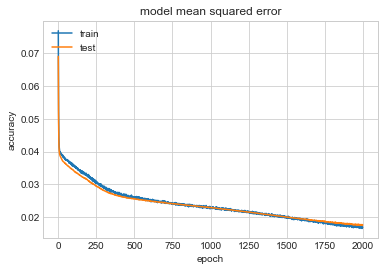

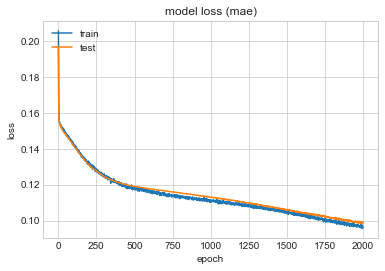

In [56]:
sns.set_style('whitegrid')
plt.plot(history.history['mean_squared_error'])
plt.plot(history.history['val_mean_squared_error'])
plt.title('model mean squared error')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss (mae)')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [57]:
model.load_weights('best_weights.h5')
model.evaluate(x_test_scaled, y_test)

1000/1000 [==============================] - 0s 62us/step


[0.09824143224954605, 0.01749306183308363]